# Fitting foregrounds with missing modes

Would like to fit high lmax foregrounds using a model with a lower lmax = lmod.
This reduces the fidelity of our reconstruction. Let's use missing 
modes-modelling assuming that the missing modes are Gaussian with the same power
spectrum as the foregrounds and see if this helps.

In [10]:
from pygdsm import GlobalSkyModel2016
import healpy as hp
import numpy as np
from numpy.linalg import svd
from scipy.special import eval_legendre
import matplotlib.pyplot as plt
import seaborn as sns

import src.beam_functions as BF
import src.spherical_harmonics as SH
import src.forward_model as FM
import src.sky_models as SM
import src.map_making as MM
import src.plotting as PL

RS = SH.RealSphericalHarmonics()

In [34]:
lmax=32
nside=16
npix = hp.nside2npix(nside)
# Generate the ylm matrix for later.
ylm_mat = SH.calc_spherical_harmonic_matrix(nside=nside, lmax=lmax)

# Generate foreground map.
fg_full_map = GlobalSkyModel2016(resolution='low').generate(60)
fg_alm = RS.real2ComplexALM(SM.foreground_gsma_alm(nu=60))
fg_cl = hp.alm2cl(fg_alm)
# Convert foreground map to real alm and Cl.
#fg_cl = hp.sphtfunc.anafast(fg_full_map, lmax=64*2)

fg_gauss_alm = hp.synalm(fg_cl, lmax=lmax)
fg_gauss_alm = RS.complex2RealALM(fg_gauss_alm)

3072 561


In [35]:
# Observe the Gaussian random field.
narrow_cosbeam = lambda x : BF.beam_cos(x, theta0=0.8)
times = np.linspace(0, 24, 40, endpoint=False)
lats = np.linspace(-89, 89, 19)#np.linspace(-60, 60, 13)
mat_A_fm, (mat_G, mat_P, mat_Y, mat_B) = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=lmax, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=True)

###################
#mat_A_fm, (mat_G, mat_Y, mat_B) = FM.calc_observation_matrix_all_pix(nside=nside, lmax=lmax, Ntau=1500, Nt=npix, beam_use=narrow_cosbeam, return_mat=True)
#mat_P_identity = np.diag([1]*npix)
#mat_A_fm = mat_G @ mat_P_identity @ mat_Y @ mat_B
###################
d = mat_A_fm @ fg_gauss_alm

# Add noise.
#d_noisy, noise_covar = SM.add_noise(d, 1, Ntau=len(times), t_int=1e4, seed=124)
d_noisy, noise_covar = SM.add_noise(d, 1, Ntau=2000, t_int=1e4, seed=124)
d_noisy_seed2, noise_covar_seed2 = SM.add_noise(d, 1, Ntau=2000, t_int=1e4, seed=100)

3072 561


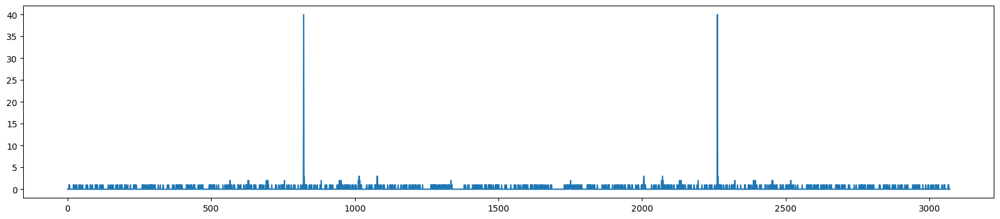

In [36]:
# Fill in the P matrix where it's lacking.
    
fig, ax = plt.subplots(1,1,figsize=(20,4))
ax.plot(np.sum(mat_P, axis=0))

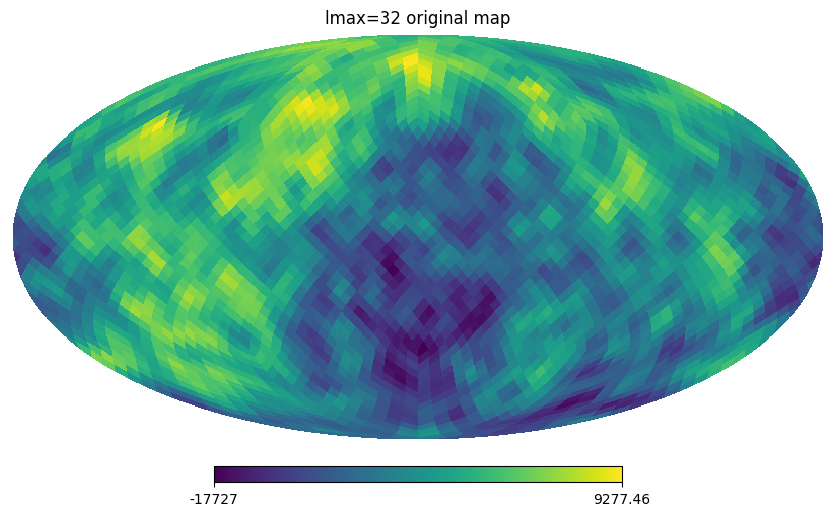

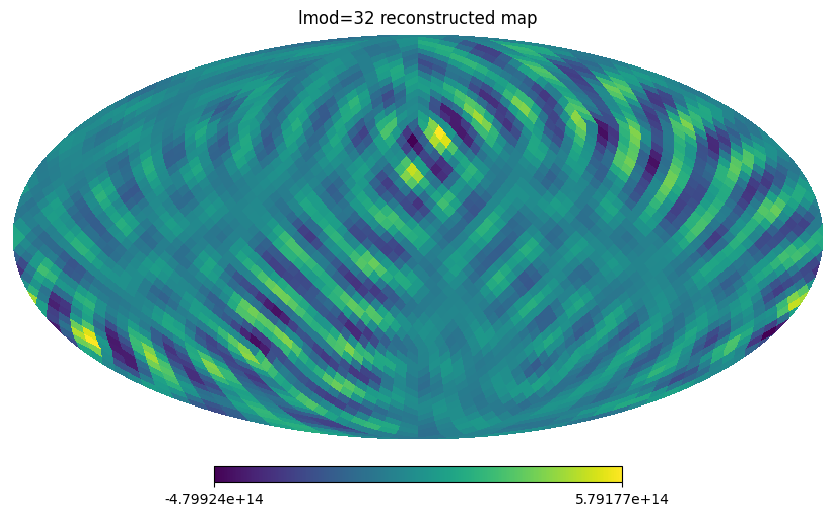

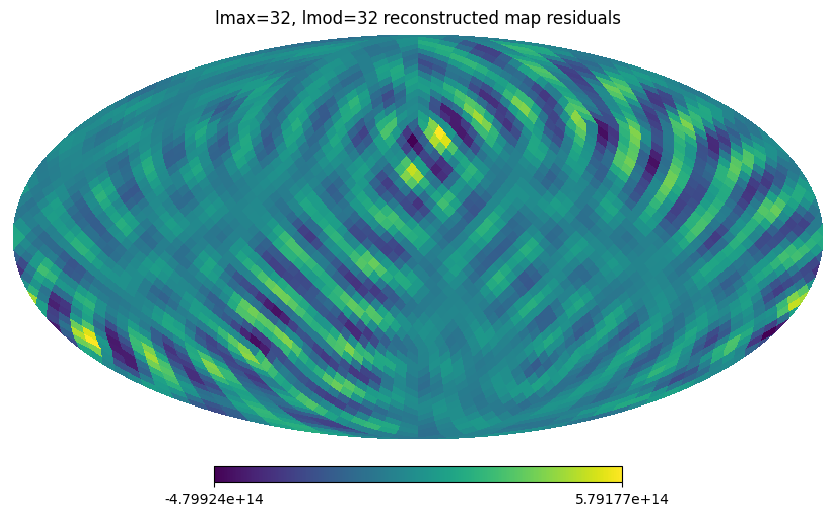

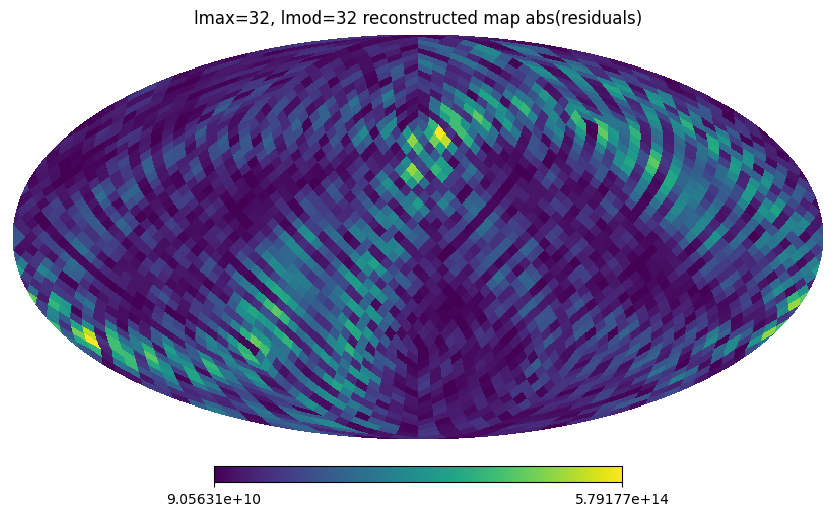

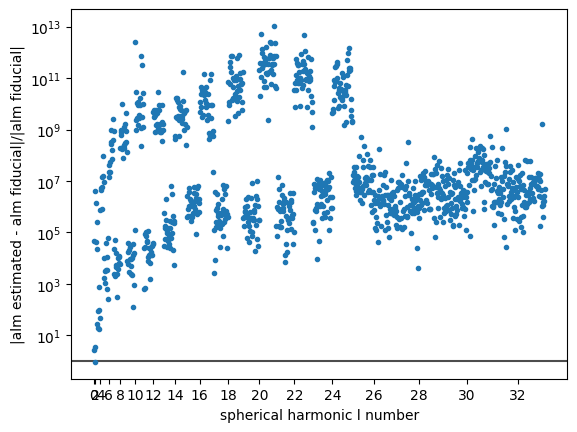

In [37]:
mat_W_perfect, cov_perfect = MM.calc_ml_estimator_matrix(mat_A=mat_A_fm, mat_N=noise_covar, cov=True)
a_ml_noisy = mat_W_perfect @ d_noisy
PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_noisy, ylm_mat=ylm_mat)

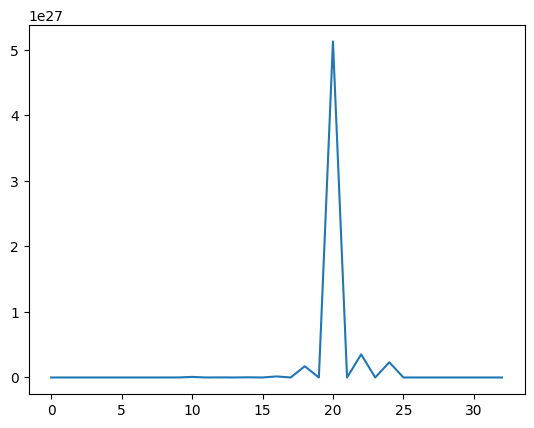

In [38]:
wobbly_cl = hp.alm2cl(RS.real2ComplexALM(a_ml_noisy))
plt.plot(wobbly_cl)

In [39]:
from importlib import reload; reload(PL)

<module 'src.plotting' from '/Users/yordani/Documents/boosted_compass/matrix-observer/src/plotting.py'>

3072 325


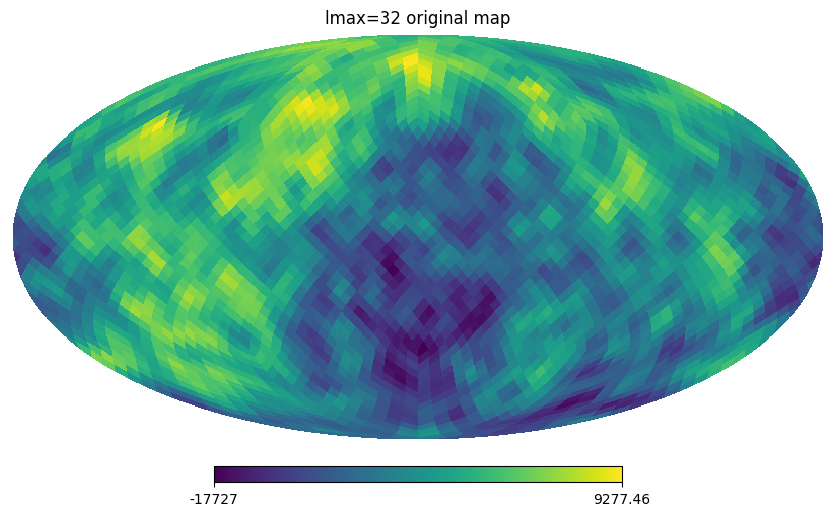

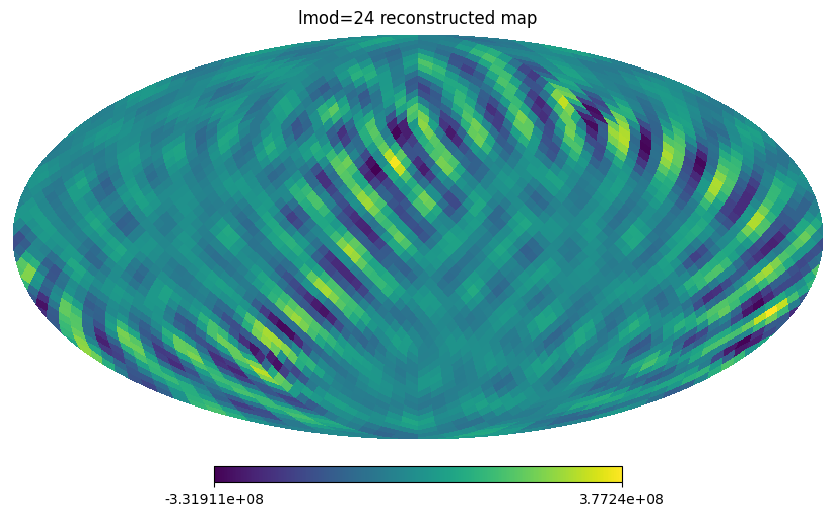

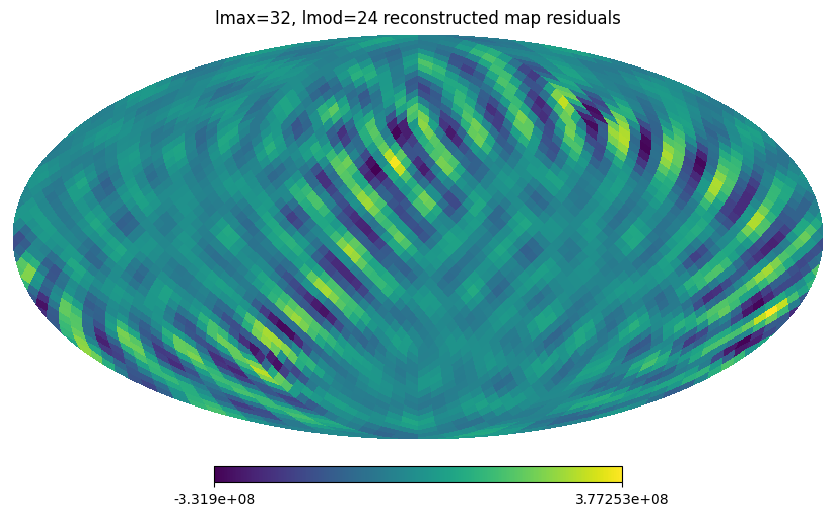

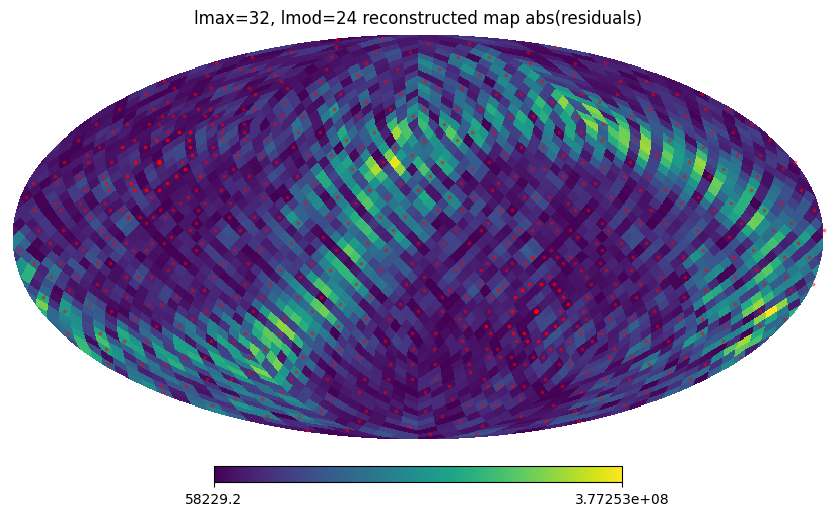

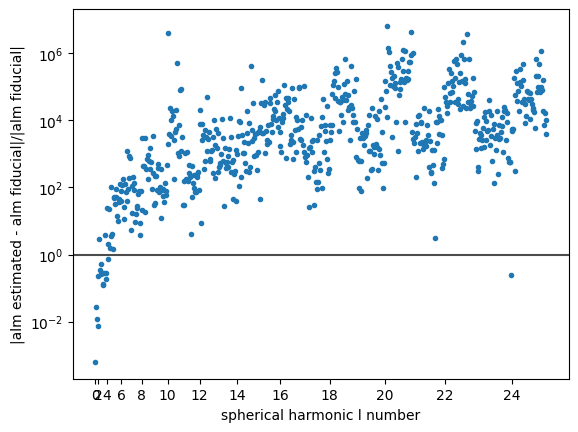

In [40]:
mat_A_trunc = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=24, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=False)

mat_W_trunc, cov_trunc = MM.calc_ml_estimator_matrix(mat_A=mat_A_trunc, mat_N=noise_covar, cov=True)
a_ml_trunc = mat_W_trunc @ d_noisy
PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_trunc, ylm_mat=ylm_mat, mat_P=mat_P)


3072 231


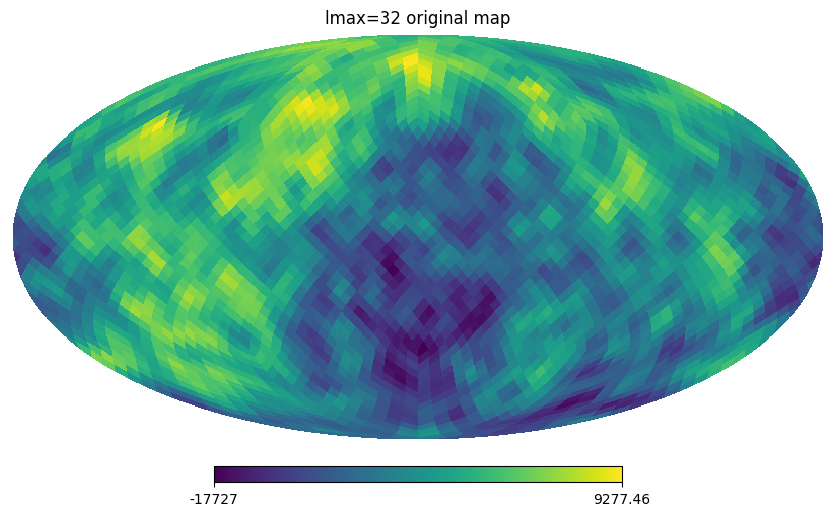

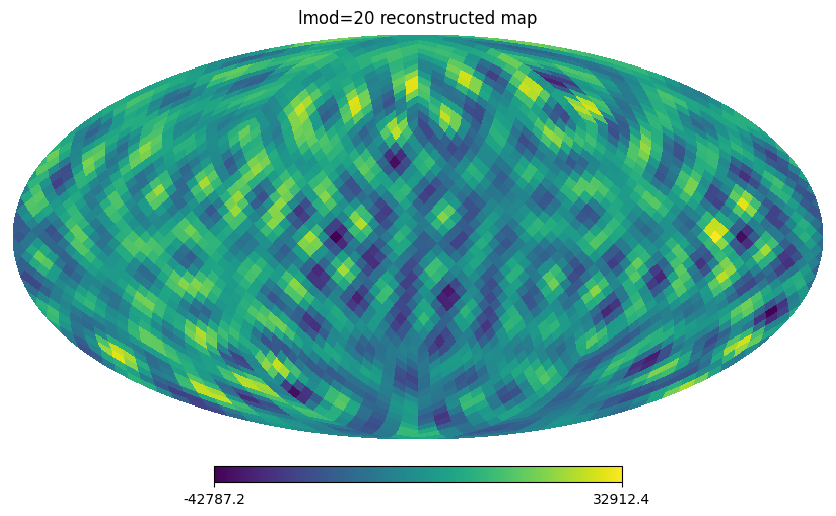

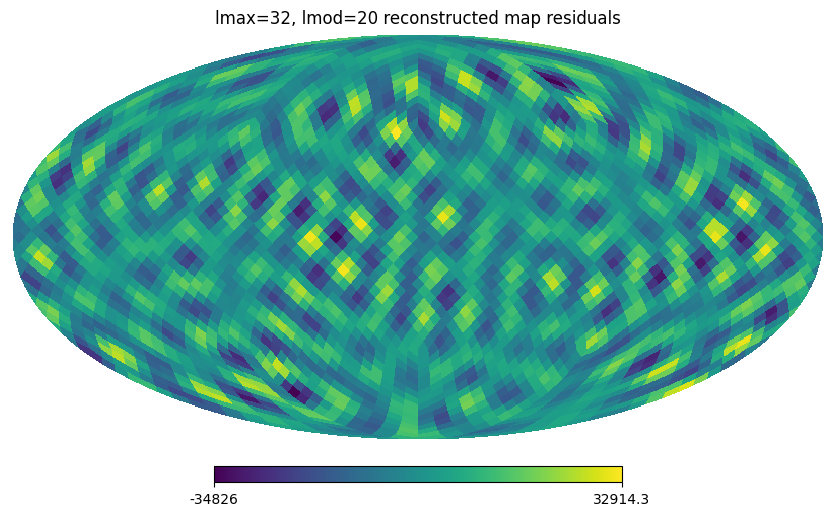

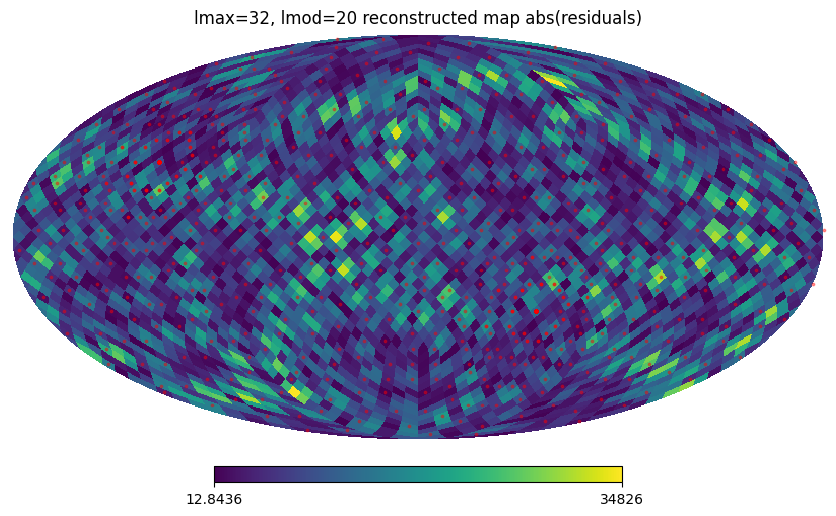

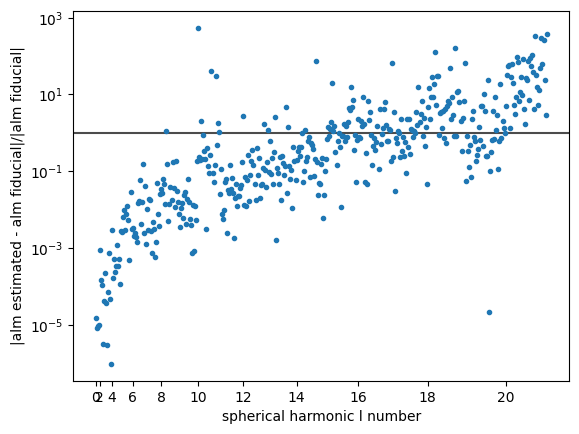

In [41]:
mat_A_trunc = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=20, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=False)

mat_W_trunc, cov_trunc = MM.calc_ml_estimator_matrix(mat_A=mat_A_trunc, mat_N=noise_covar, cov=True)
a_ml_trunc_20 = mat_W_trunc @ d_noisy
PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_trunc_20, ylm_mat=ylm_mat, mat_P=mat_P)


3072 136


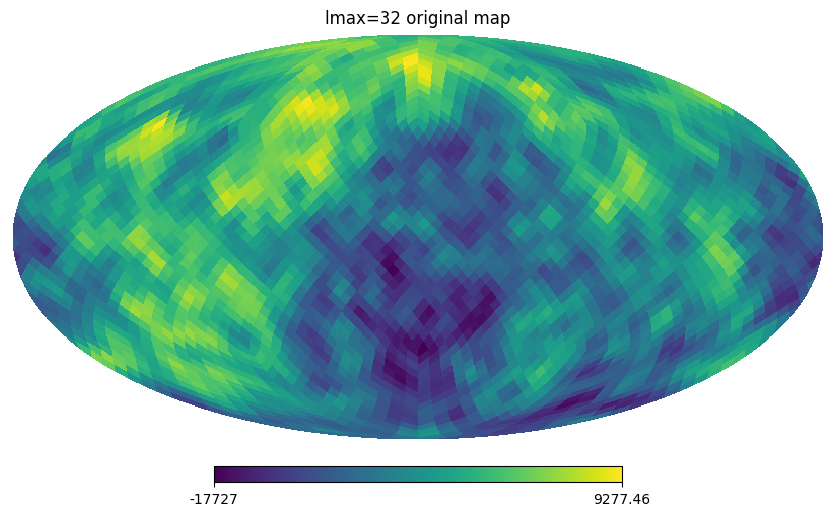

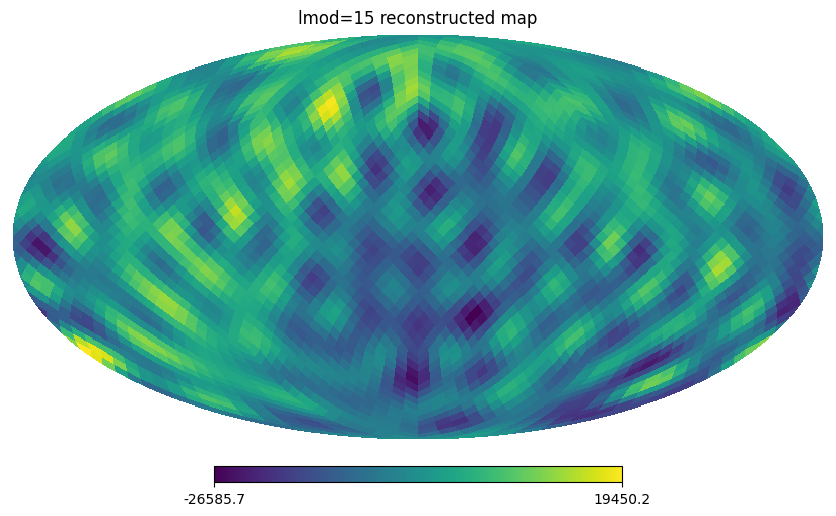

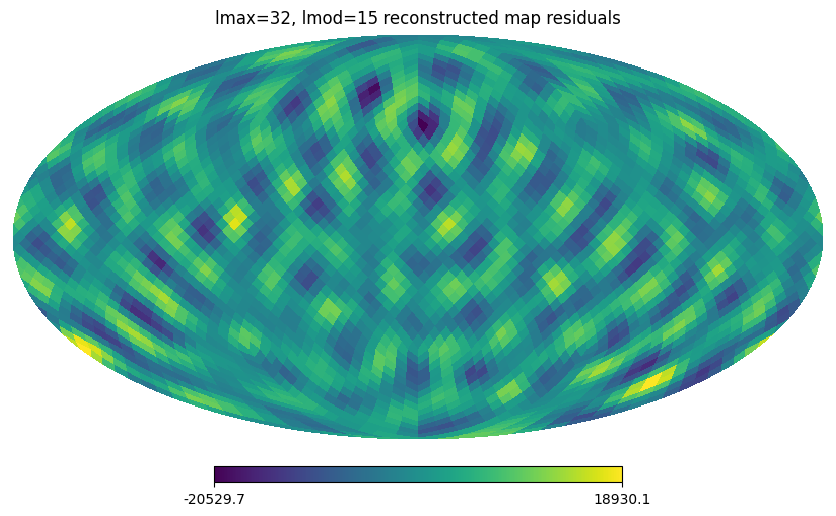

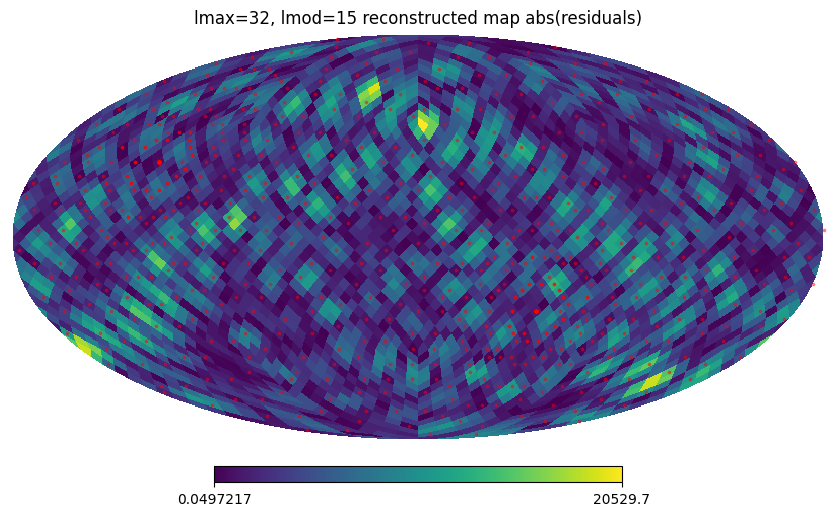

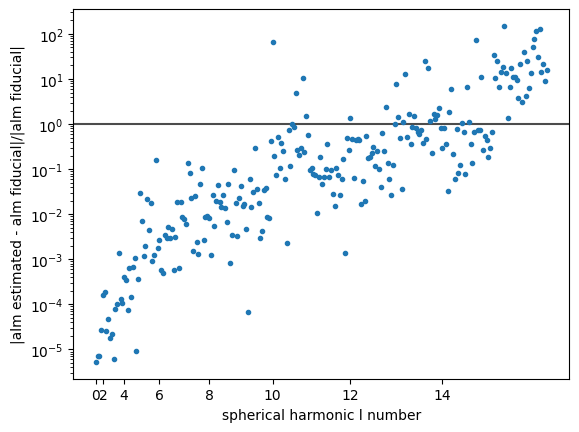

In [42]:
mat_A_trunc = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=15, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=False)

mat_W_trunc, cov_trunc = MM.calc_ml_estimator_matrix(mat_A=mat_A_trunc, mat_N=noise_covar, cov=True)
a_ml_trunc_15 = mat_W_trunc @ d_noisy
PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_trunc_15, ylm_mat=ylm_mat, mat_P=mat_P)


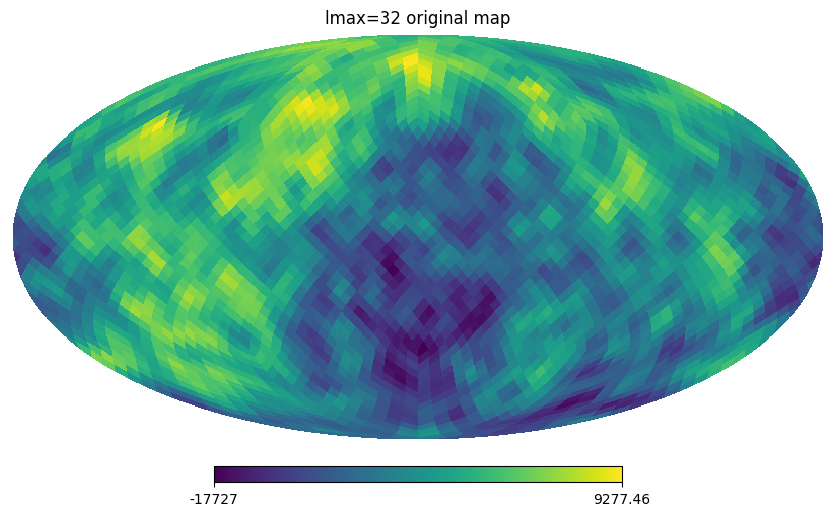

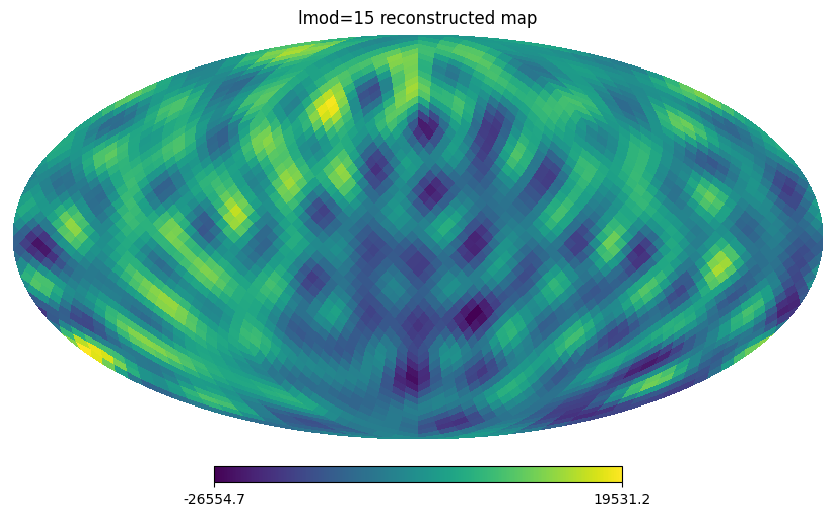

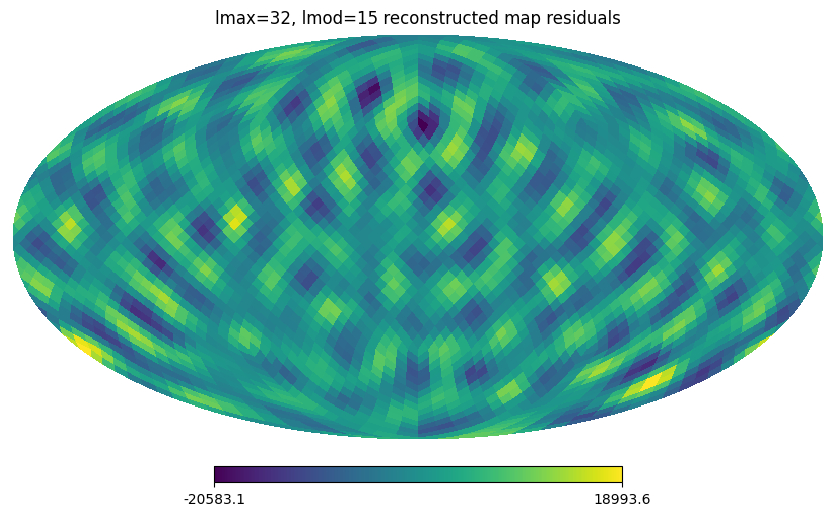

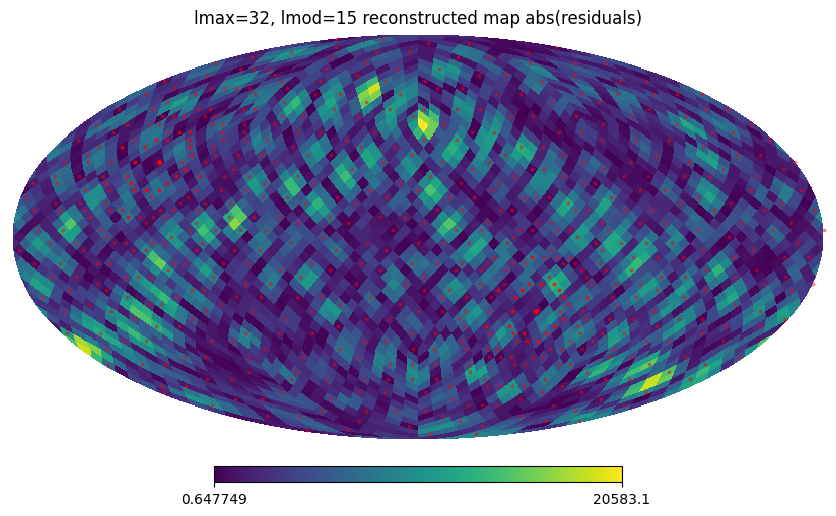

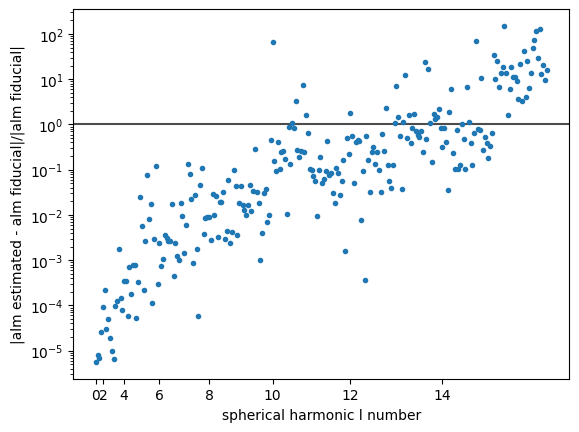

In [43]:
a_ml_trunc_seed2 = mat_W_trunc @ d_noisy_seed2
PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_trunc_seed2, ylm_mat=ylm_mat, mat_P=mat_P)

3072 45


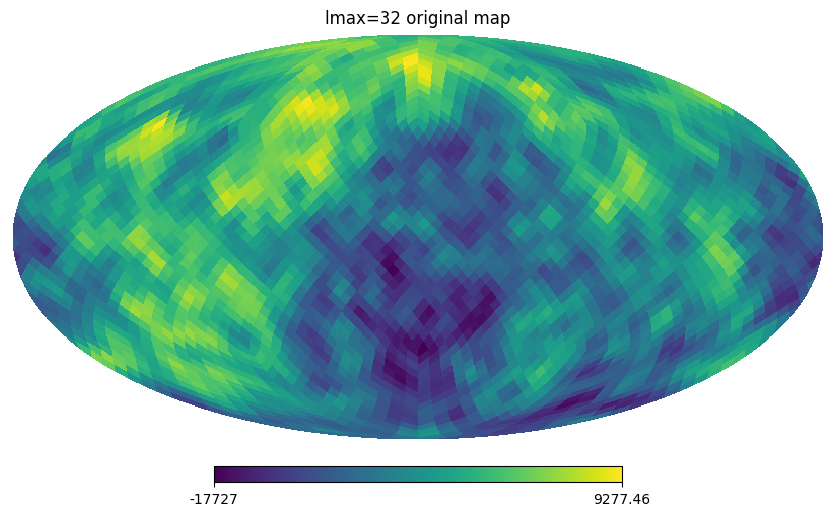

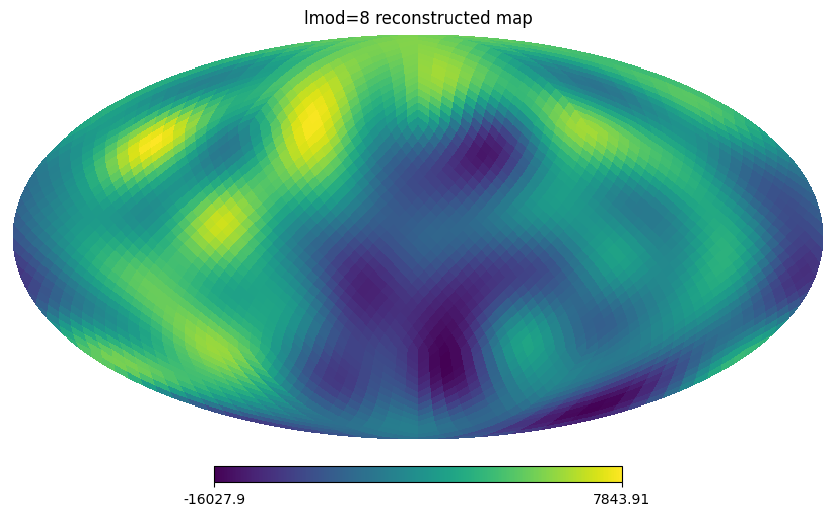

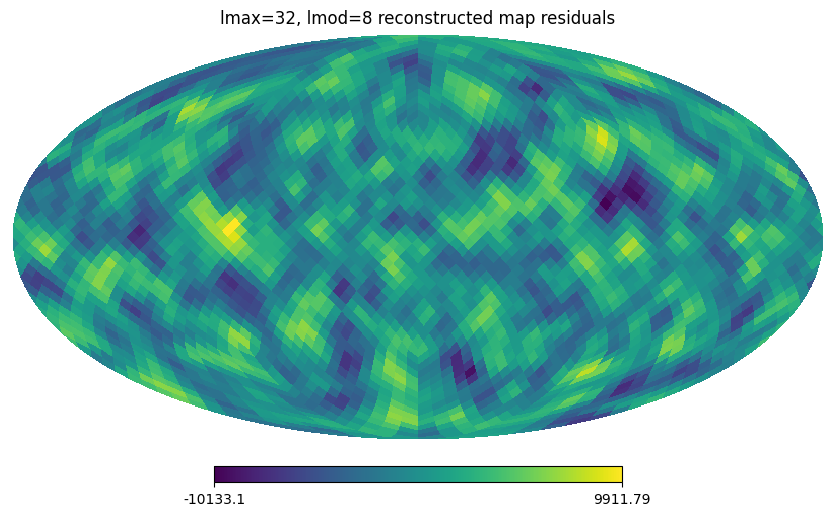

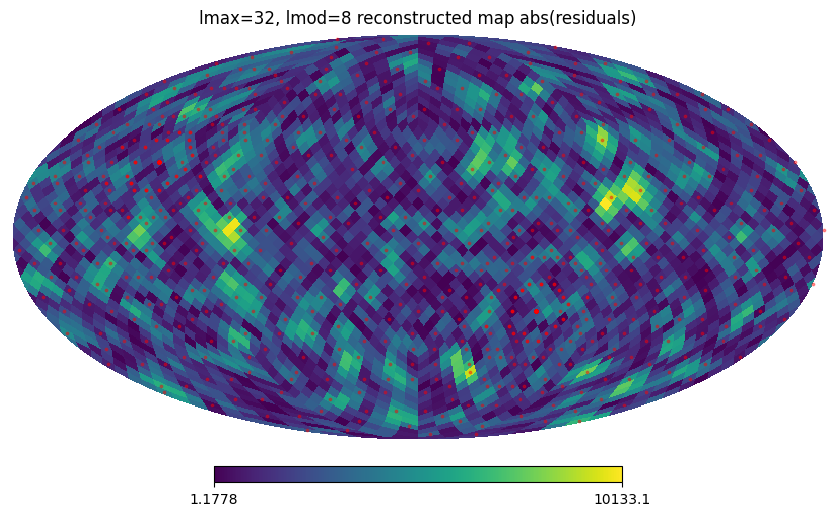

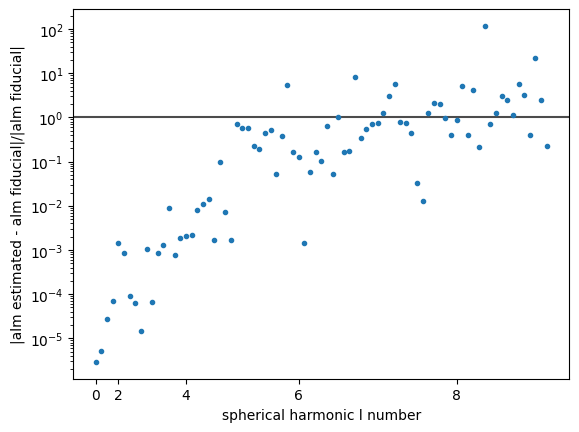

In [44]:
mat_A_trunc = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=8, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=False)

mat_W_trunc, cov_trunc = MM.calc_ml_estimator_matrix(mat_A=mat_A_trunc, mat_N=noise_covar, cov=True)
a_ml_trunc_8 = mat_W_trunc @ d_noisy
PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_trunc_8, ylm_mat=ylm_mat, mat_P=mat_P)


3072 28


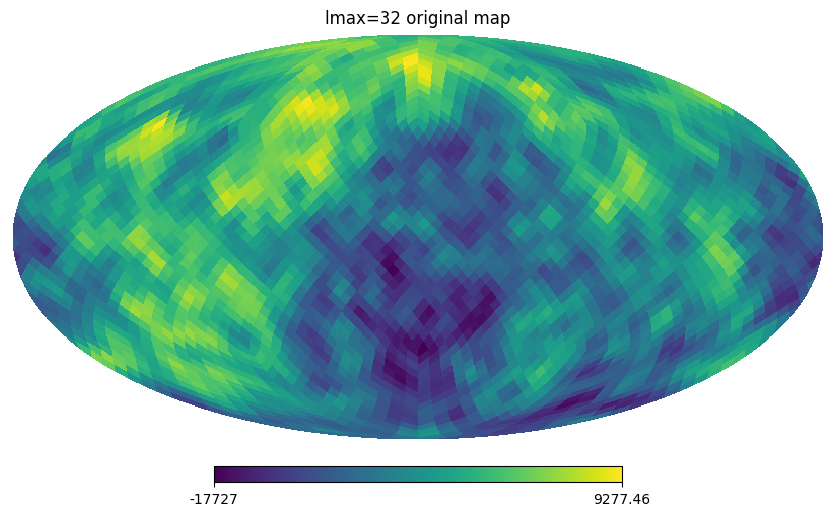

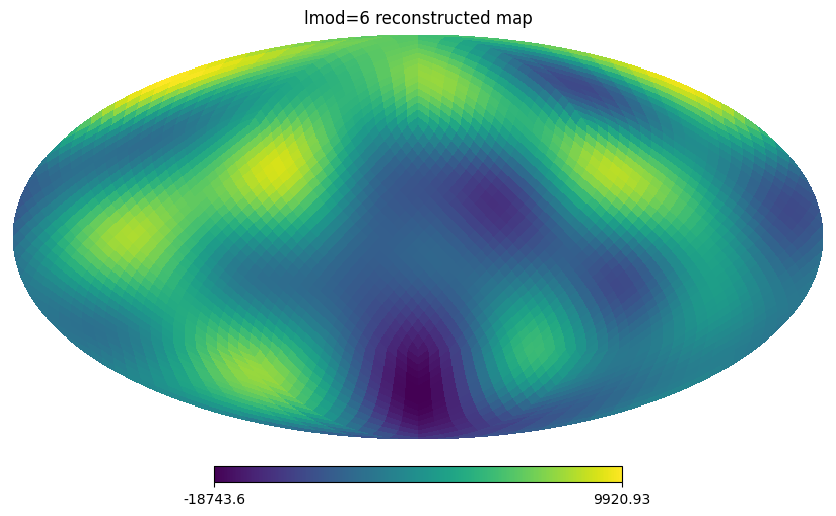

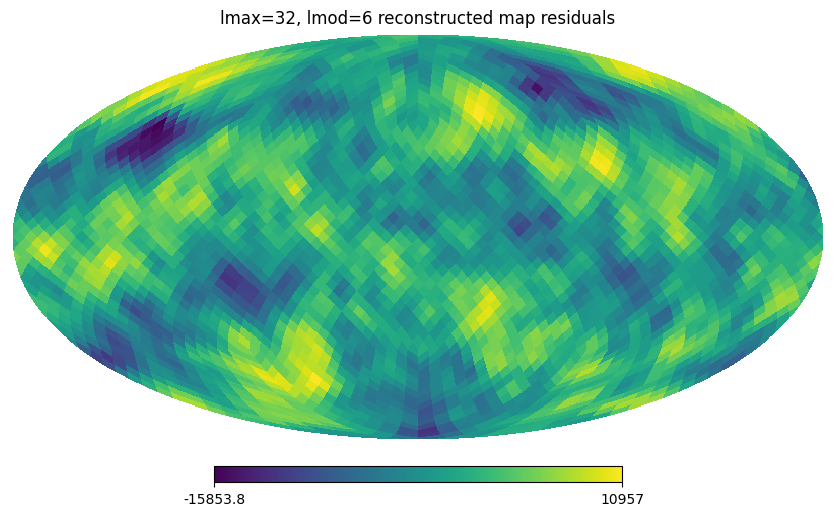

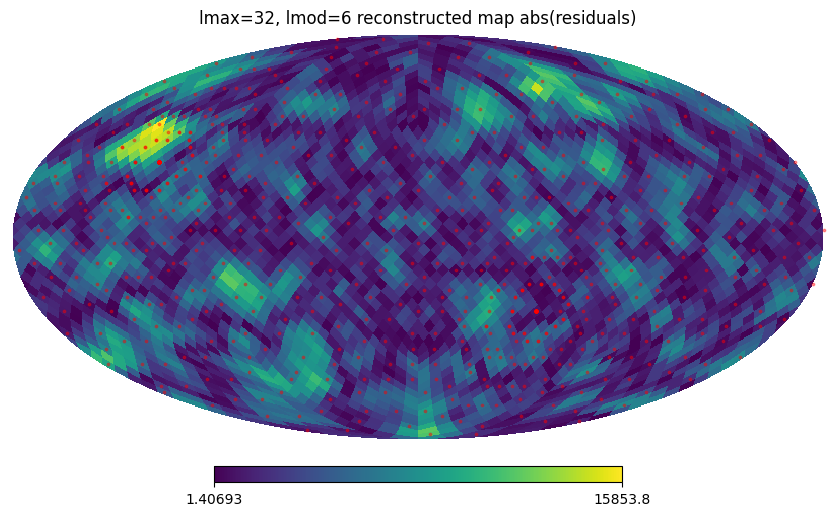

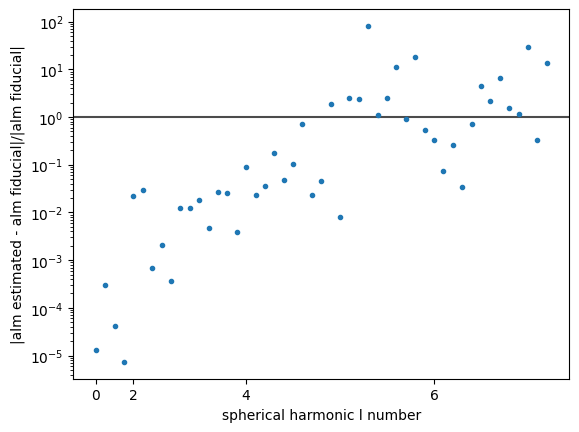

In [45]:
mat_A_trunc = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=6, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=False)

mat_W_trunc, cov_trunc = MM.calc_ml_estimator_matrix(mat_A=mat_A_trunc, mat_N=noise_covar, cov=True)
a_ml_trunc_6 = mat_W_trunc @ d_noisy
PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_trunc_6, ylm_mat=ylm_mat, mat_P=mat_P)


3072 78


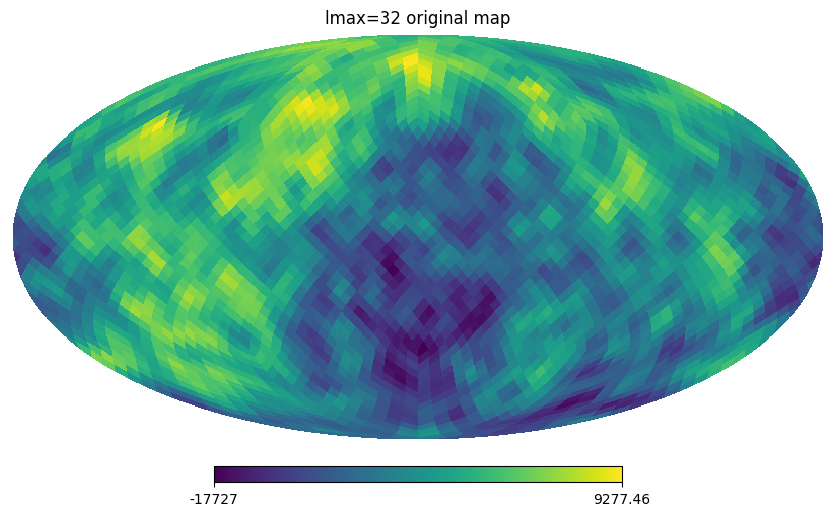

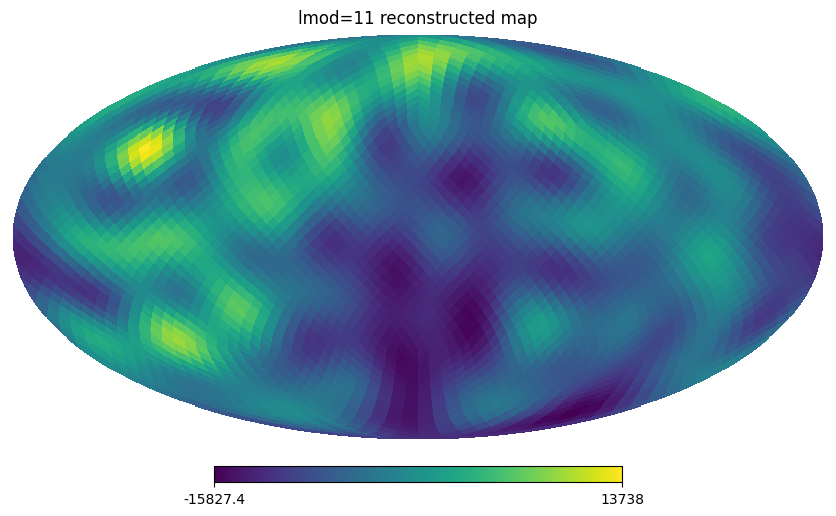

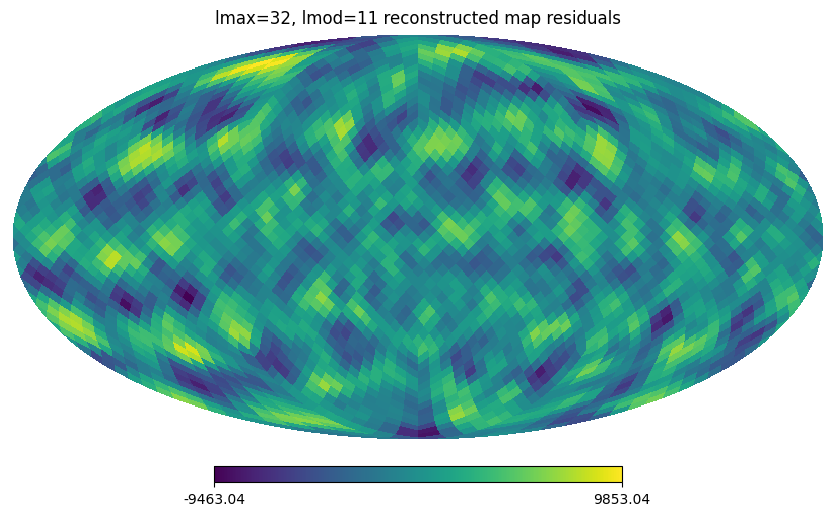

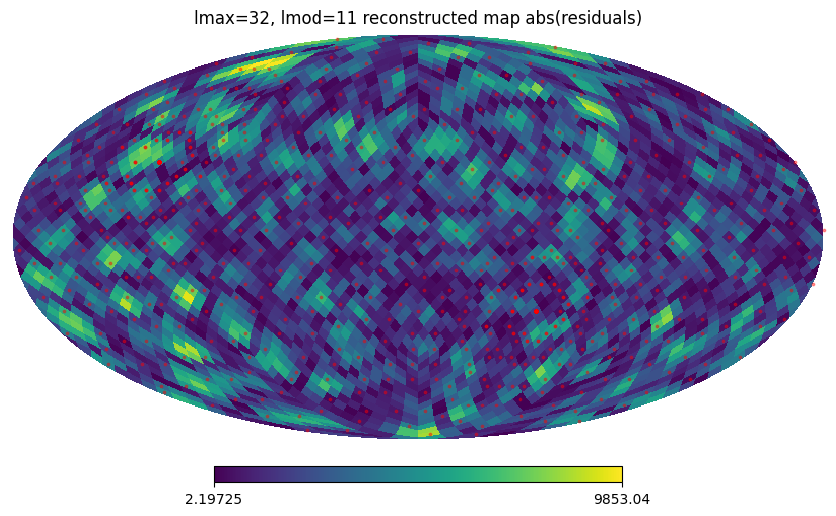

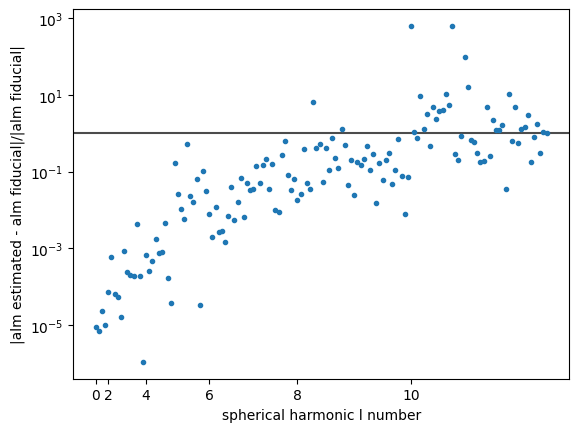

In [46]:
mat_A_trunc = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=11, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=False)

mat_W_trunc, cov_trunc = MM.calc_ml_estimator_matrix(mat_A=mat_A_trunc, mat_N=noise_covar, cov=True)
a_ml_trunc_11 = mat_W_trunc @ d_noisy
PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_trunc_11, ylm_mat=ylm_mat, mat_P=mat_P)


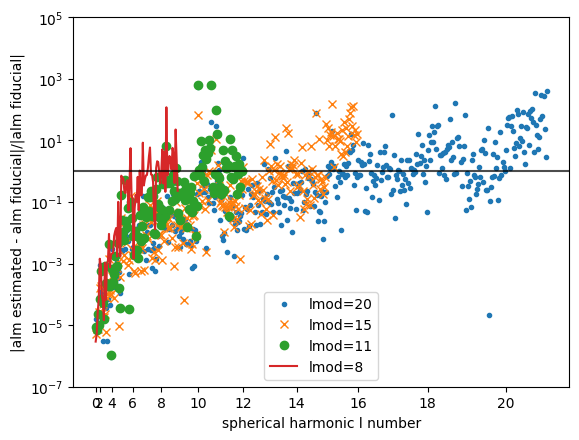

In [47]:
PL.compare_reconstructions(fg_gauss_alm, a_ml_trunc_20, a_ml_trunc_15, a_ml_trunc_11, a_ml_trunc_8, a_ml_trunc_6, labels=["lmod=20","lmod=15", "lmod=11","lmod=8", "lmod=6"], fmts=['.', 'x', 'o', '-'])

In [48]:
# Now incorporate some missing-modes modelling.
def calc_full_unmodelled_mode_matrix(lmod, lmax, nside, foreground_power_spec, beam_mat, binning_mat, pointing_mat):
    """
    Calculate the unmodelled mode matrix for the non-trivial observation 
    strategy and binning of timeseries data into Ntau bins.
    """
    npix = hp.nside2npix(nside)
    vectors = hp.pix2vec(nside, ipix=list(range(npix)))
    vectors = np.array(vectors).T
    vector_difference = np.einsum("pi,qi->pq", vectors, vectors)
    binpoint_mat = binning_mat@pointing_mat
    val = np.sum([((2*l+1)/(4*np.pi)) * eval_legendre(l, vector_difference) * foreground_power_spec[l] * beam_mat[l,l]**2 for l in range(lmod+1, lmax)], axis=0)
    return binpoint_mat@val@(binpoint_mat.T)

3072 231


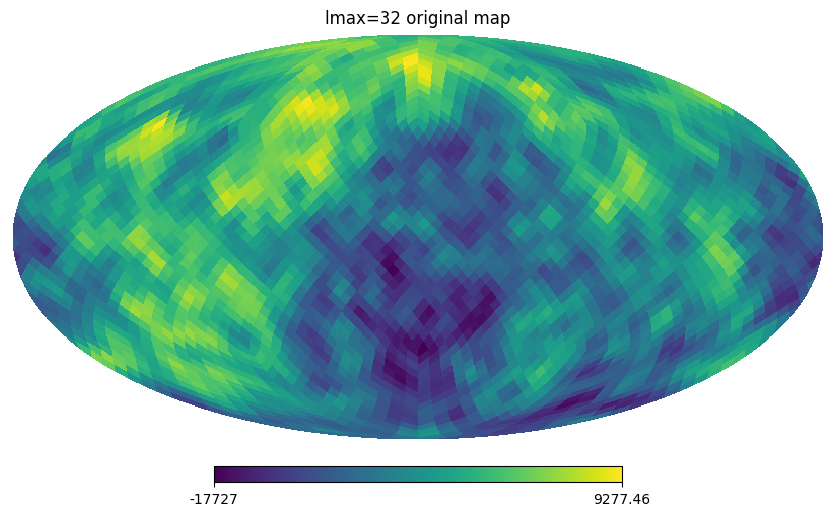

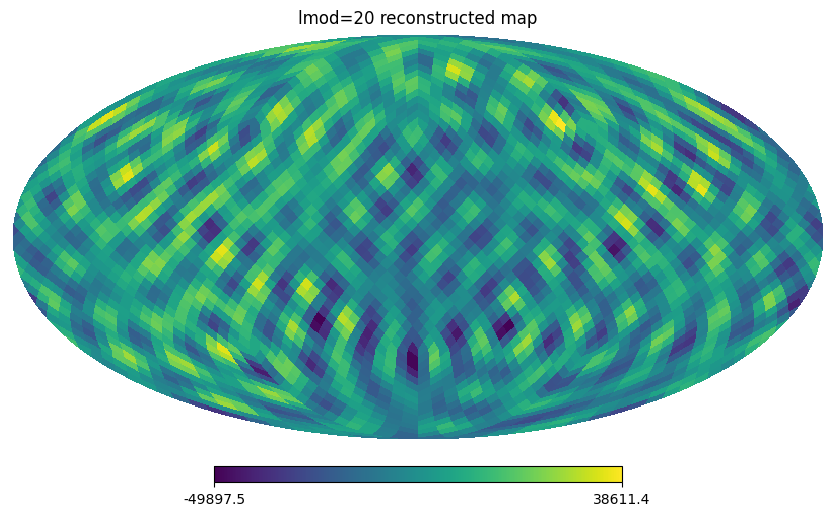

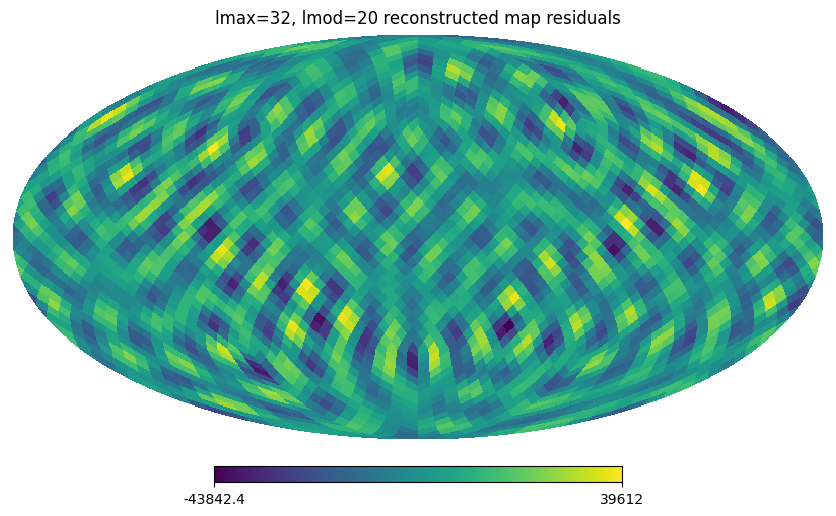

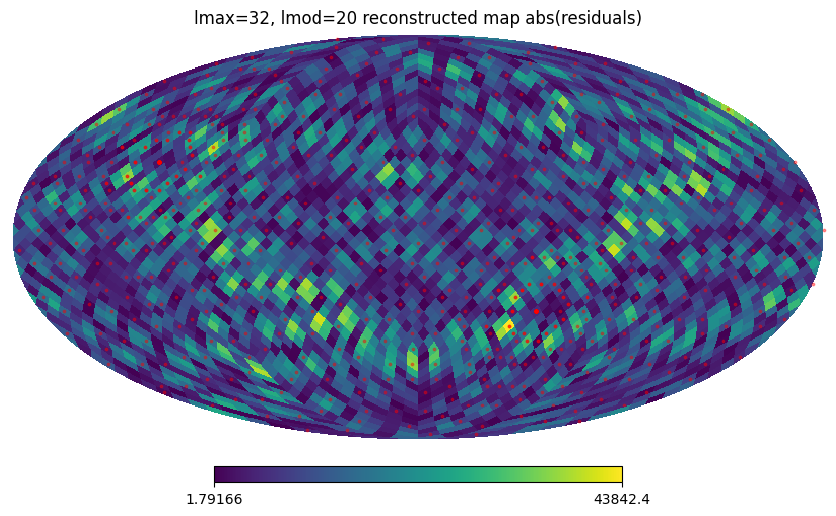

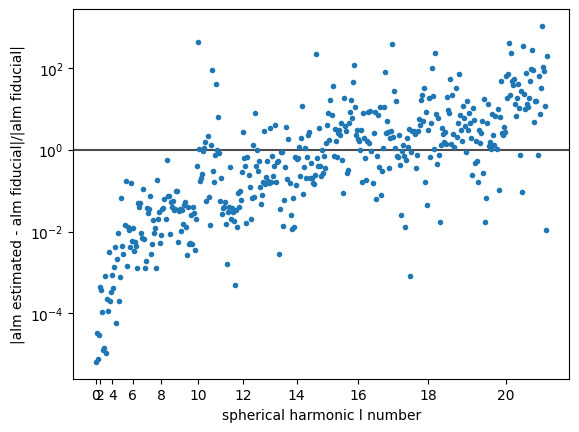

In [49]:
mat_A_trunc, (mat_G, mat_P, mat_Y, mat_B) = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=20, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=True)


mat_S = calc_full_unmodelled_mode_matrix(lmod=20, lmax=lmax, foreground_power_spec=fg_cl, nside=nside, beam_mat=mat_B, binning_mat=mat_G, pointing_mat=mat_P)

# Carry out the corrected ML estimate.
mat_W_corrected = MM.calc_ml_estimator_matrix(mat_A=mat_A_trunc, mat_N=noise_covar+mat_S)
a_ml_corrected_noisefree = mat_W_corrected @ d
a_ml_corr_trunc20 = mat_W_corrected @ d_noisy

PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_corr_trunc20, ylm_mat=ylm_mat, mat_P=mat_P)

3072 136


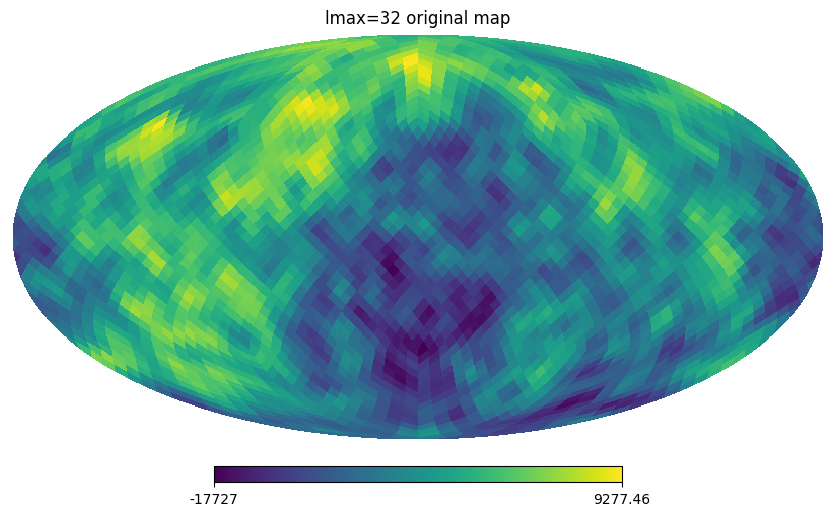

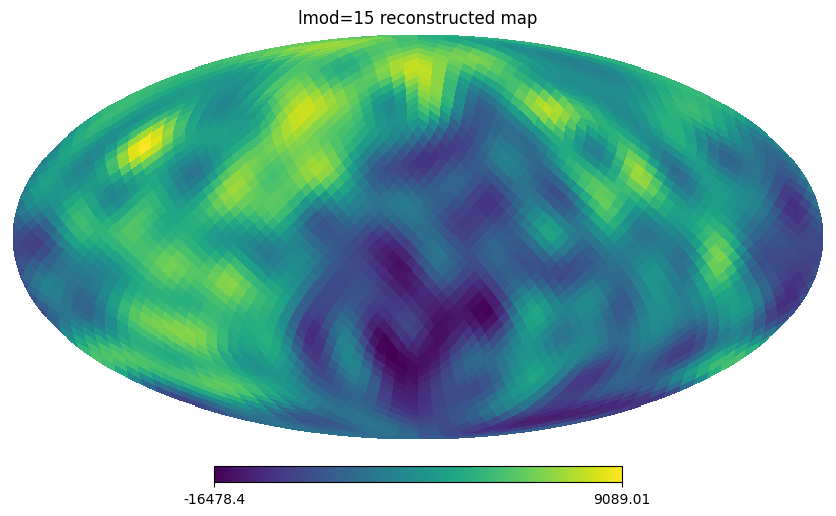

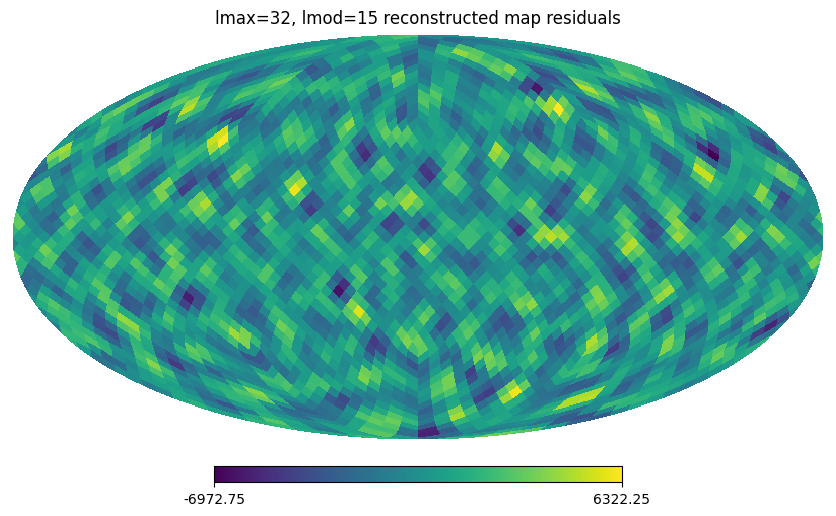

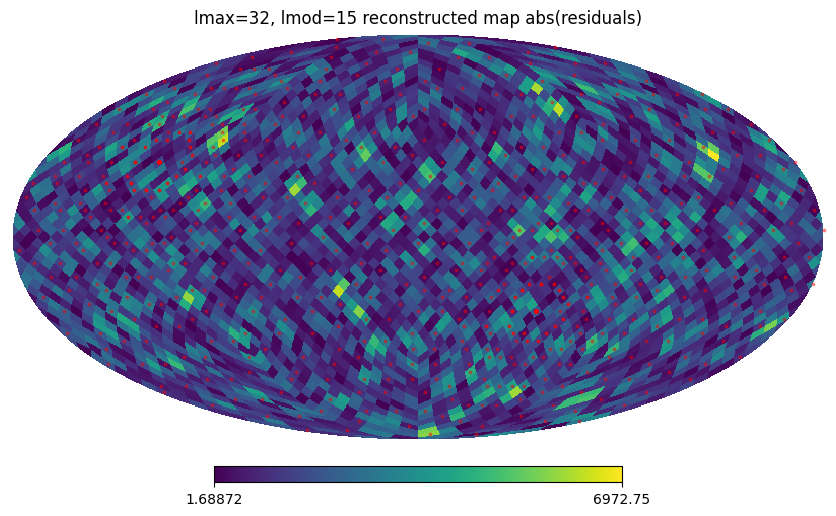

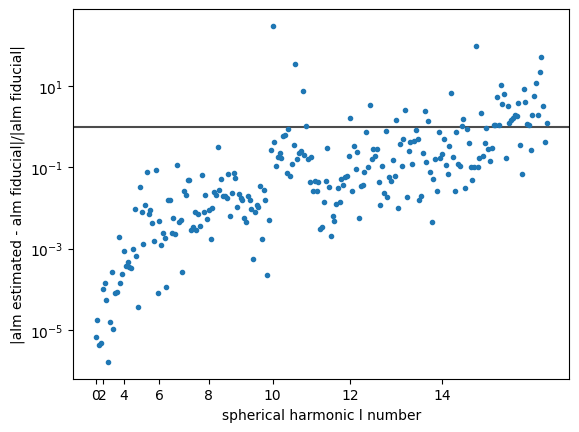

In [50]:
mat_A_trunc, (mat_G, mat_P, mat_Y, mat_B) = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=15, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=True)


mat_S = calc_full_unmodelled_mode_matrix(lmod=15, lmax=lmax, foreground_power_spec=fg_cl, nside=nside, beam_mat=mat_B, binning_mat=mat_G, pointing_mat=mat_P)

# Carry out the corrected ML estimate.
mat_W_corrected = MM.calc_ml_estimator_matrix(mat_A=mat_A_trunc, mat_N=noise_covar+mat_S)
a_ml_corrected_noisefree = mat_W_corrected @ d
a_ml_corr_trunc15 = mat_W_corrected @ d_noisy

PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_corr_trunc15, ylm_mat=ylm_mat, mat_P=mat_P)

3072 78


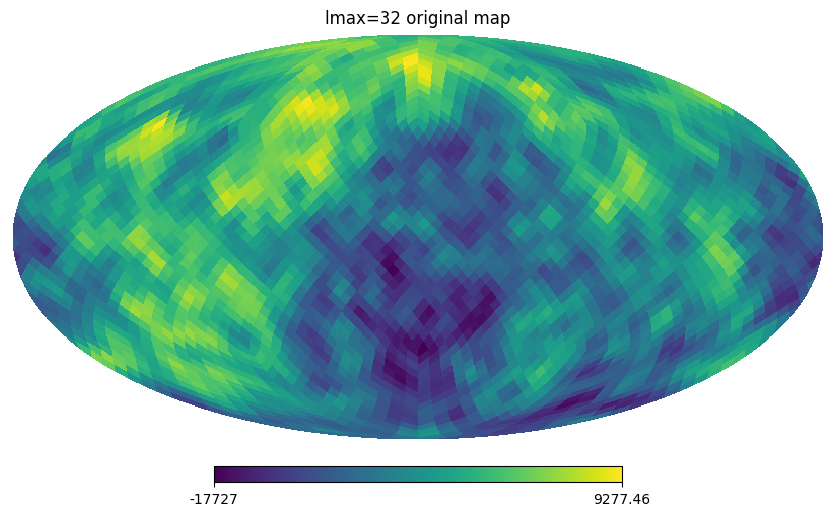

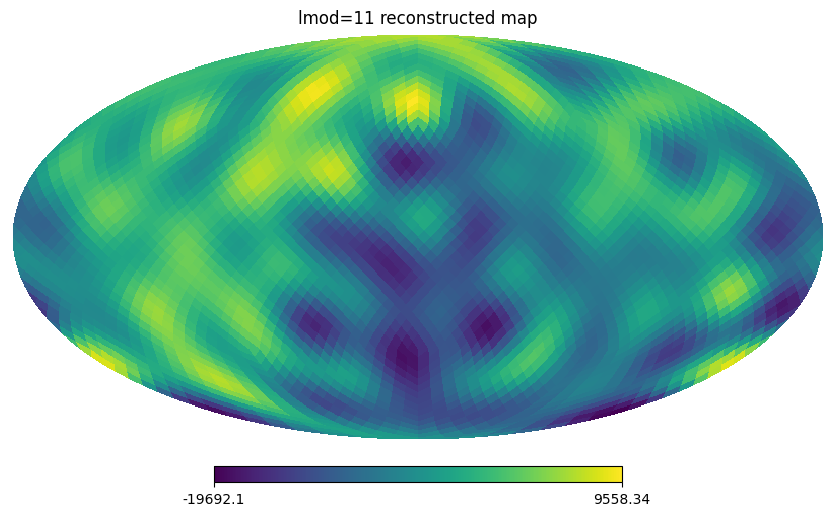

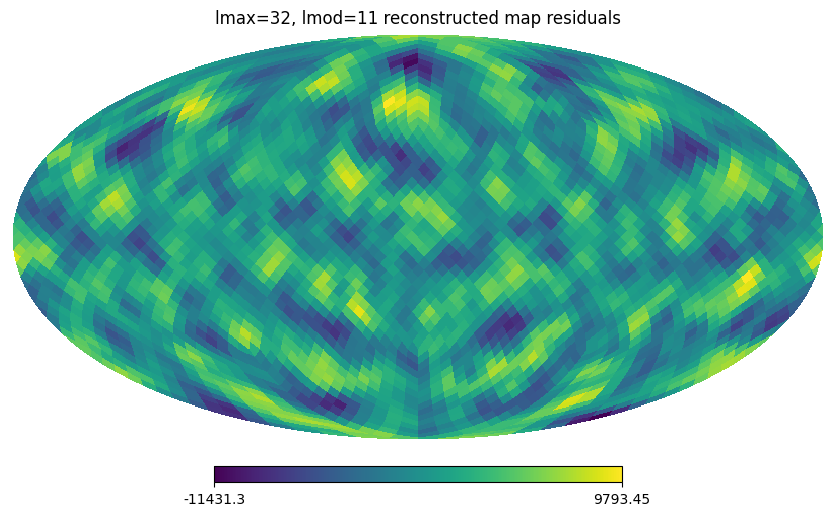

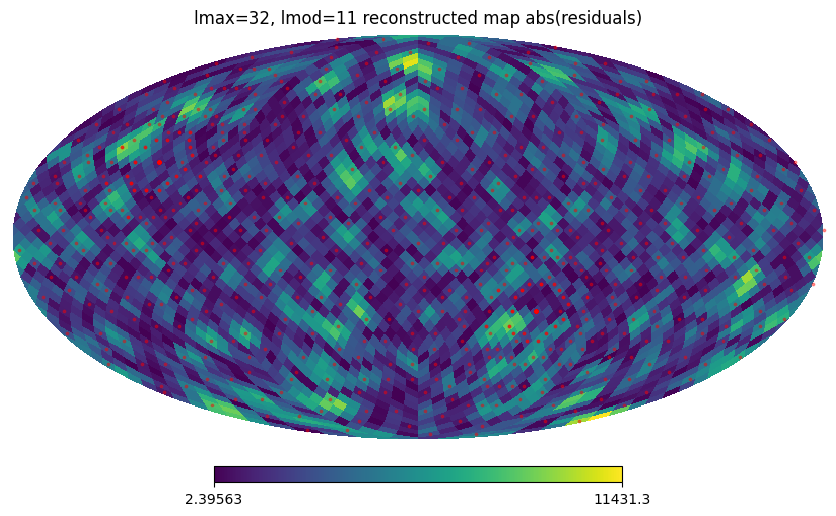

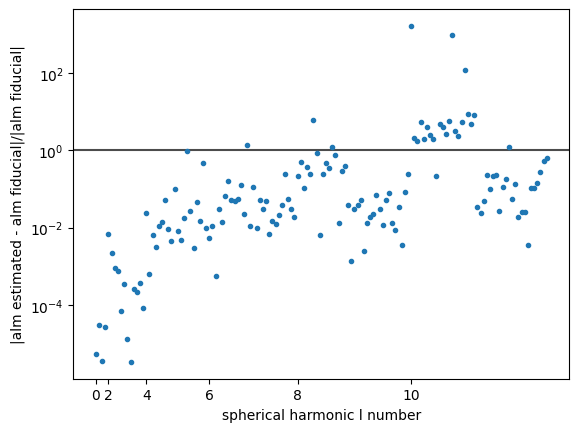

In [51]:
mat_A_trunc, (mat_G, mat_P, mat_Y, mat_B) = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=11, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=True)


mat_S = calc_full_unmodelled_mode_matrix(lmod=15, lmax=lmax, foreground_power_spec=fg_cl, nside=nside, beam_mat=mat_B, binning_mat=mat_G, pointing_mat=mat_P)

# Carry out the corrected ML estimate.
mat_W_corrected = MM.calc_ml_estimator_matrix(mat_A=mat_A_trunc, mat_N=noise_covar+mat_S)
a_ml_corrected_noisefree = mat_W_corrected @ d
a_ml_corr_trunc11 = mat_W_corrected @ d_noisy

PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_corr_trunc11, ylm_mat=ylm_mat, mat_P=mat_P)

3072 45


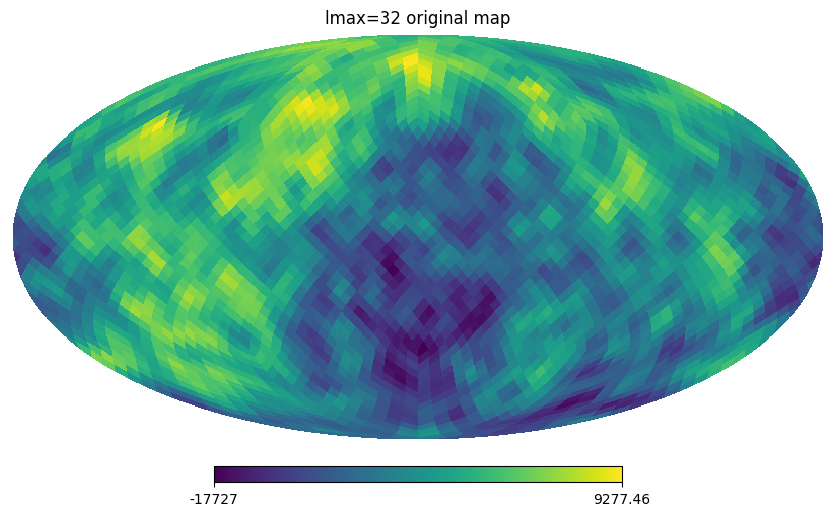

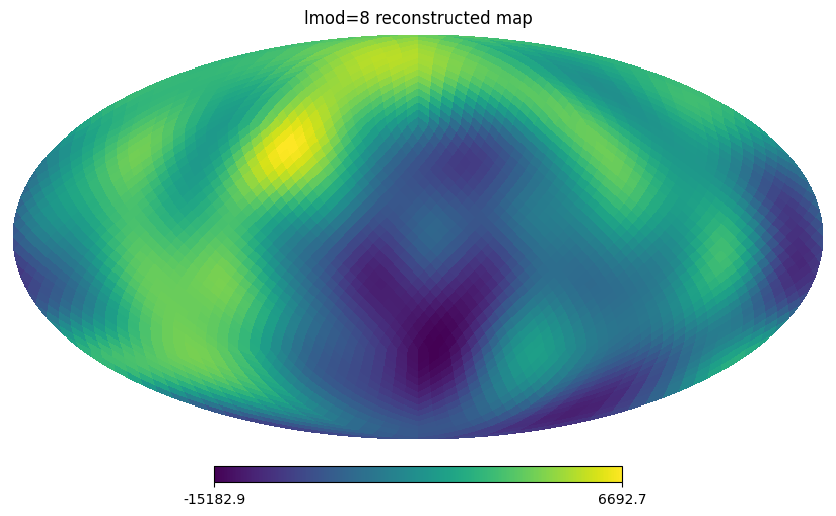

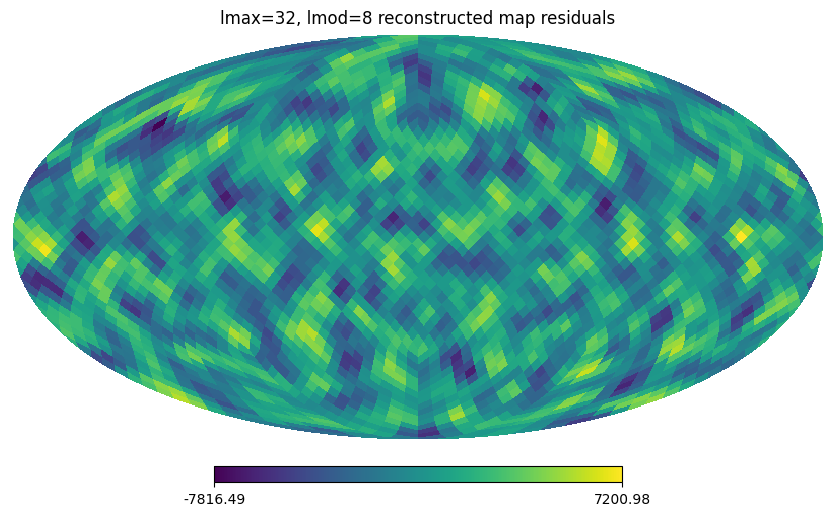

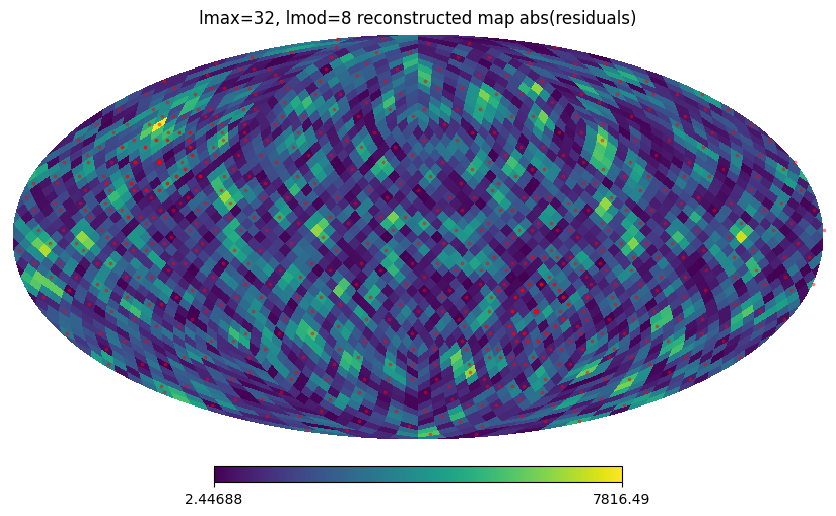

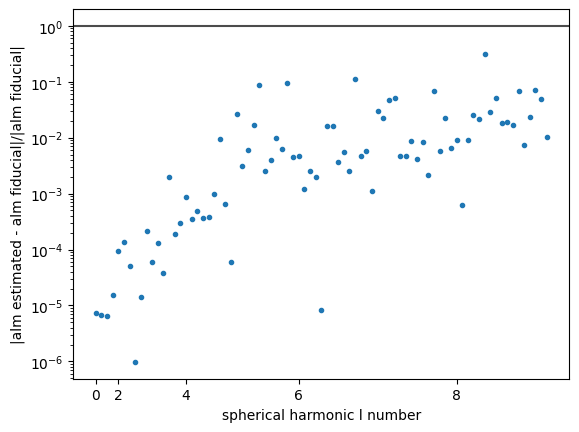

In [52]:
mat_A_trunc, (mat_G, mat_P, mat_Y, mat_B) = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=8, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=True)


mat_S = calc_full_unmodelled_mode_matrix(lmod=8, lmax=lmax, foreground_power_spec=fg_cl, nside=nside, beam_mat=mat_B, binning_mat=mat_G, pointing_mat=mat_P)

# Carry out the corrected ML estimate.
mat_W_corrected = MM.calc_ml_estimator_matrix(mat_A=mat_A_trunc, mat_N=noise_covar+mat_S)
a_ml_corrected_noisefree = mat_W_corrected @ d
a_ml_corr_trunc8 = mat_W_corrected @ d_noisy

PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_corr_trunc8, ylm_mat=ylm_mat, mat_P=mat_P)

3072 28


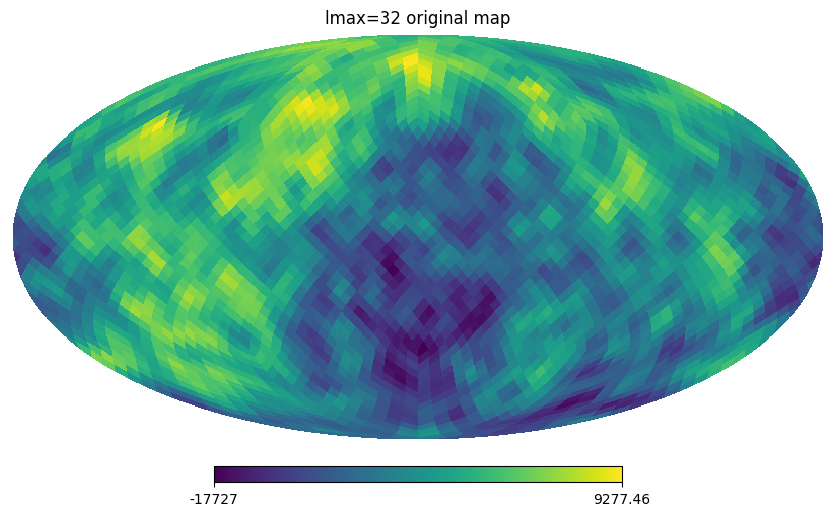

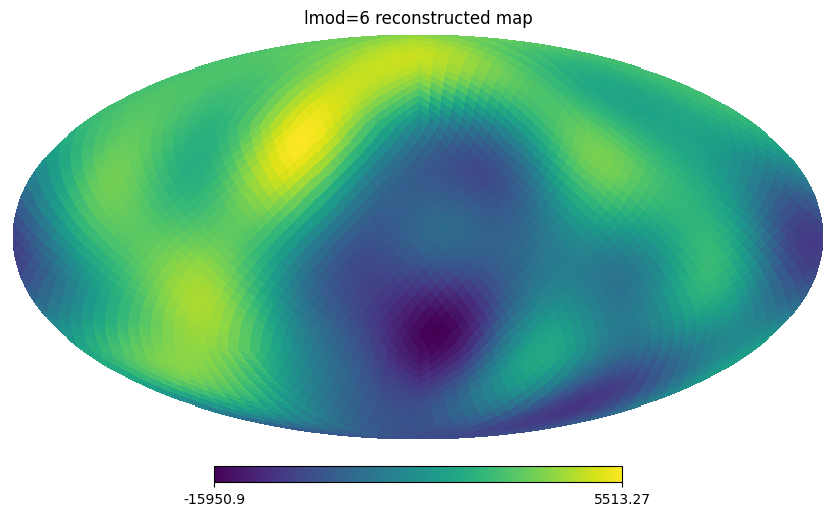

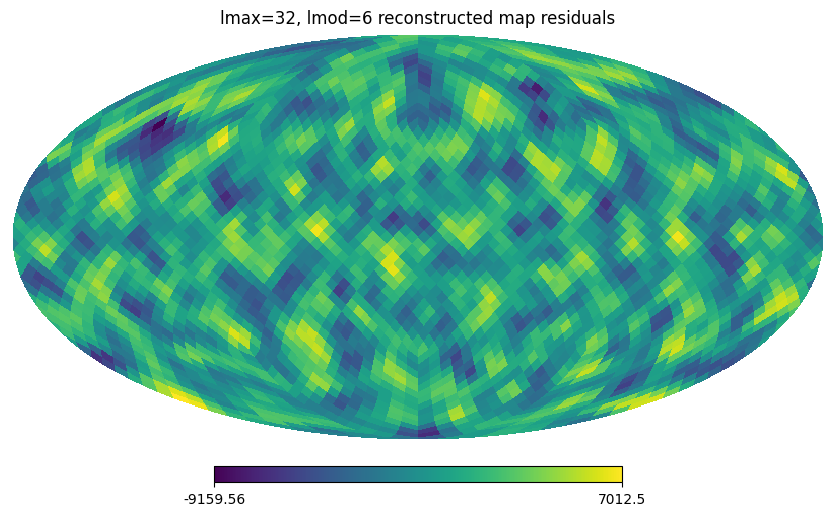

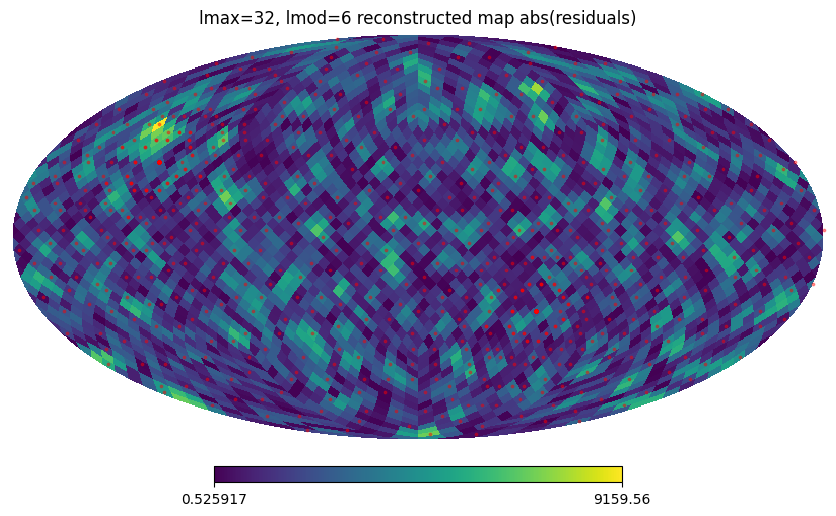

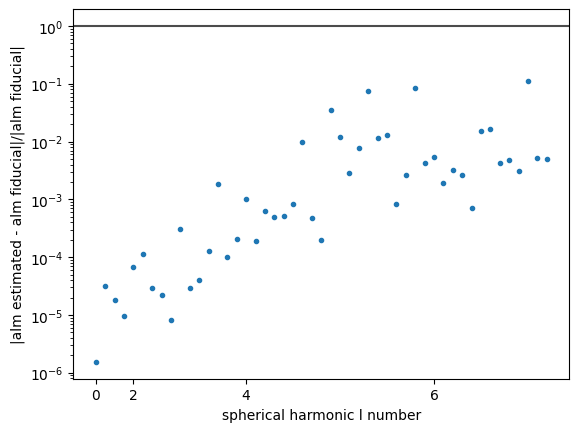

In [53]:
mat_A_trunc, (mat_G, mat_P, mat_Y, mat_B) = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=6, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=True)


mat_S = calc_full_unmodelled_mode_matrix(lmod=6, lmax=lmax, foreground_power_spec=fg_cl, nside=nside, beam_mat=mat_B, binning_mat=mat_G, pointing_mat=mat_P)

# Carry out the corrected ML estimate.
mat_W_corrected = MM.calc_ml_estimator_matrix(mat_A=mat_A_trunc, mat_N=noise_covar+mat_S)
a_ml_corrected_noisefree = mat_W_corrected @ d
a_ml_corr_trunc6 = mat_W_corrected @ d_noisy

PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_corr_trunc6, ylm_mat=ylm_mat, mat_P=mat_P)

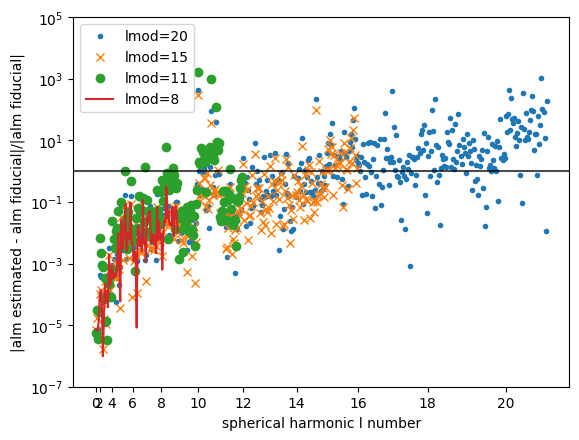

In [54]:
PL.compare_reconstructions(fg_gauss_alm, a_ml_corr_trunc20, a_ml_corr_trunc15, a_ml_corr_trunc11, a_ml_corr_trunc8, a_ml_corr_trunc6, labels=["lmod=20","lmod=15", "lmod=11","lmod=8", "lmod=6"], fmts=['.', 'x', 'o', '-'])

In [15]:
hypnosis_cl = hp.alm2cl(RS.real2ComplexALM(a_ml_trunc))

c1 = 15
c2 = 13
c3 = 20
c4 = 10
a_ml_trunc_clean = np.array(a_ml_trunc)
a_ml_trunc_clean[RS.get_idx(l=c1, m=-c1):RS.get_idx(l=c1, m=c1)+1] = np.ones(c1*2+1)*np.sqrt(5e5)
a_ml_trunc_clean[RS.get_idx(l=c2, m=-c2):RS.get_idx(l=c2, m=c2)+1] = np.ones(c2*2+1)*np.sqrt(8e5)
a_ml_trunc_clean[RS.get_idx(l=c3, m=-c3):RS.get_idx(l=c3, m=c3)+1] = np.ones(c3*2+1)*np.sqrt(8e5)
a_ml_trunc_clean[RS.get_idx(l=c4, m=-c4):RS.get_idx(l=c4, m=c4)+1] = np.ones(c4*2+1)*np.sqrt(8e5)

nonhypnotic_cl = hp.alm2cl(RS.real2ComplexALM(a_ml_trunc_clean))


plt.semilogy(hypnosis_cl)
plt.semilogy(nonhypnotic_cl, '.')
plt.show()

PL.compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_trunc_clean, ylm_mat=ylm_mat)

ValueError: could not broadcast input array from shape (41,) into shape (0,)

In [13]:
a_ml_trunc_clean = np.array(a_ml_trunc)
a_ml_trunc_clean[RS.get_idx(l=15, m=-15):RS.get_idx(l=15, m=15)+1] = np.zeros(15*2+1)

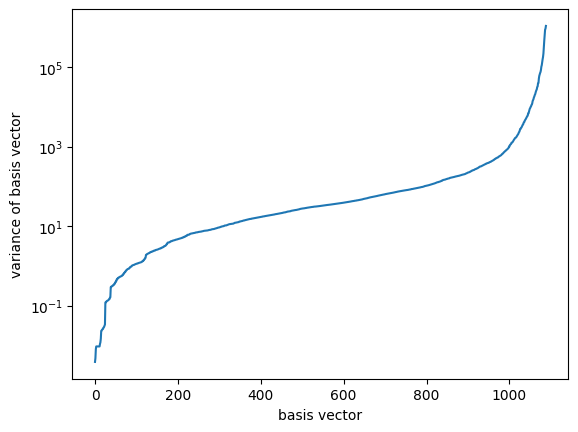

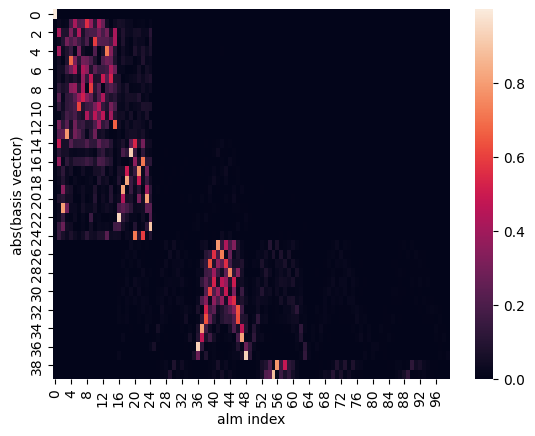

Text(0.5, 0, 'alm index')

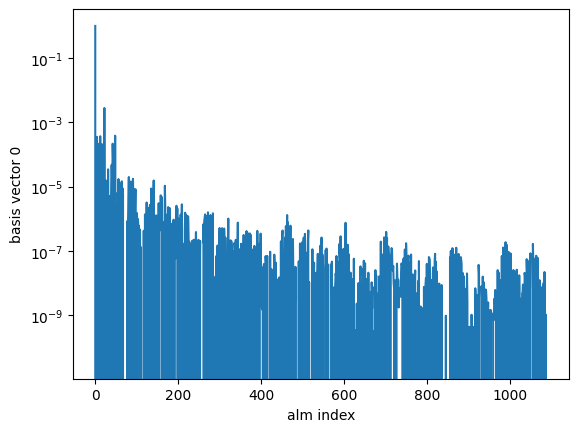

In [21]:
# Carry out SVD on the covariance matrix of the reconstructed alm. 
mat_U, arr_S, mat_Vh = svd(cov_perfect, full_matrices=False)

# Flip the arrays: we're interested in the lowest-variance components.
arr_S = np.flip(arr_S)
mat_Vh = np.flip(mat_Vh, axis=0)
mat_U = np.flip(mat_U, axis=1)

# Plot things of interest.
plt.semilogy(np.sqrt(arr_S))
plt.xlabel("basis vector")
plt.ylabel("variance of basis vector")
plt.show()

sns.heatmap(abs(mat_Vh[0:40,:100]))
plt.ylabel("abs(basis vector)")
plt.xlabel("alm index")
plt.show()

plt.semilogy(mat_Vh[0])
plt.ylabel("basis vector 0")
plt.xlabel("alm index")

In [ ]:
rms_trend = []
for Ntau in [500, 1000, 1500, 2000, 2500, 3000]:
    mat_A_fm, (mat_G, mat_Y, mat_B) = FM.calc_observation_matrix_all_pix(nside=nside, lmax=lmax, Ntau=Ntau, Nt=npix, beam_use=narrow_cosbeam, return_mat=True)
    d = mat_A_fm @ fg_gauss_alm
    d_noisy, noise_covar = SM.add_noise(d, 1, Ntau=Ntau, t_int=1e4, seed=124)

    # First model the Gaussian random field perfectly.
    mat_W_perfect = MM.calc_ml_estimator_matrix(mat_A=mat_A_fm, mat_N=noise_covar)
    a_ml_noisefree = mat_W_perfect @ d
    a_ml_noisy = mat_W_perfect @ d_noisy

    # Noise free case.
    rms_trend.append(compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_noisefree, ylm_mat=ylm_mat))


Text(0, 0.5, 'Total RMS reconstruction error')

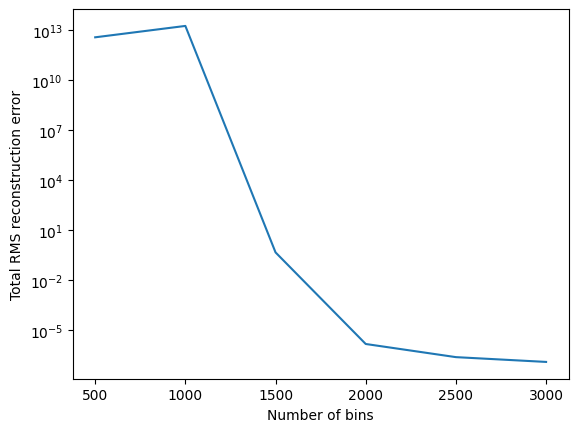

In [20]:
plt.semilogy([500, 1000, 1500, 2000, 2500, 3000], rms_trend)
plt.xlabel("Number of bins")
plt.ylabel("Total RMS reconstruction error")

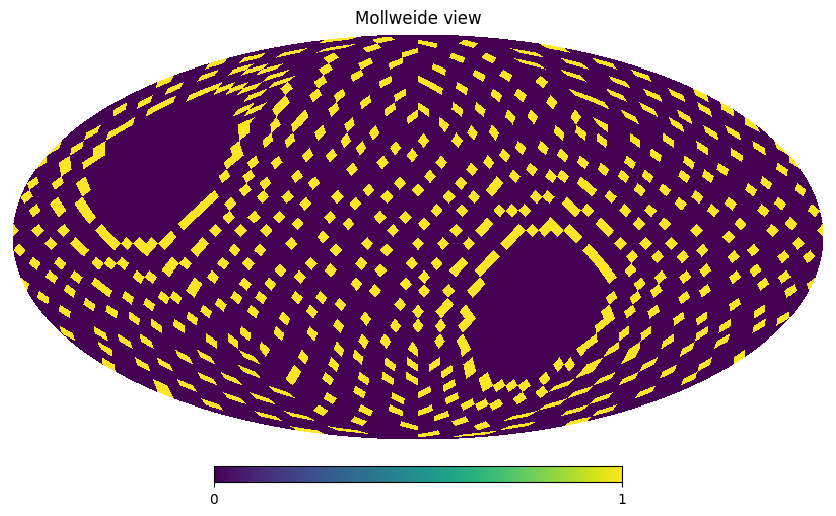

In [16]:
def find_ones_columns(matrix):
    # Convert the input matrix to a NumPy array
    np_matrix = np.array(matrix)
    # Use np.argmax to find the column index of the first occurrence of 1 in each row
    ones_columns = np.argmax(np_matrix, axis=1).tolist()
    return ones_columns
    
indxs = find_ones_columns(mat_P)
m = np.zeros(hp.nside2npix(nside))
for indx in indxs:
    m[indx] += 1
hp.mollview(map=m)

In [25]:
# Sort the P matrix to see if that would change anything.
ordering = np.argsort(np.array(indxs))
mat_P_ordered = mat_P[ordering]

# Observe with the ordered P-matrix.
mat_A_ordered = mat_P_ordered @ mat_Y @ mat_B
d_ordered = mat_A_ordered @ fg_gauss_alm

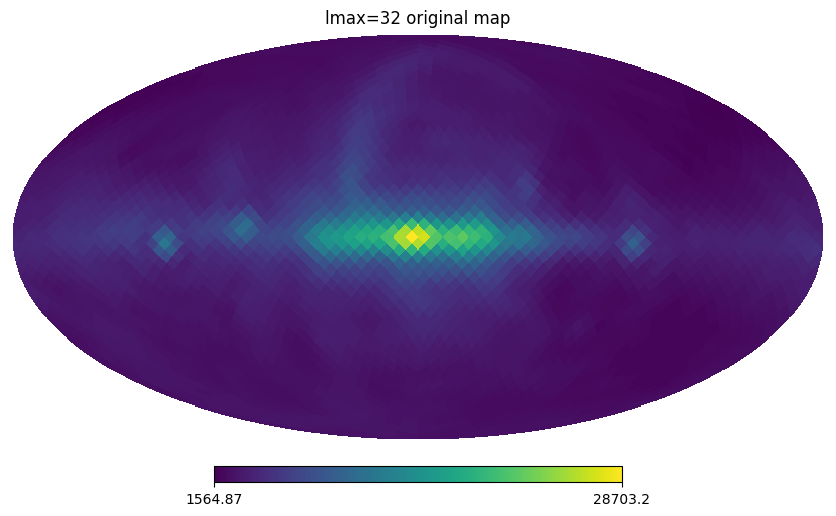

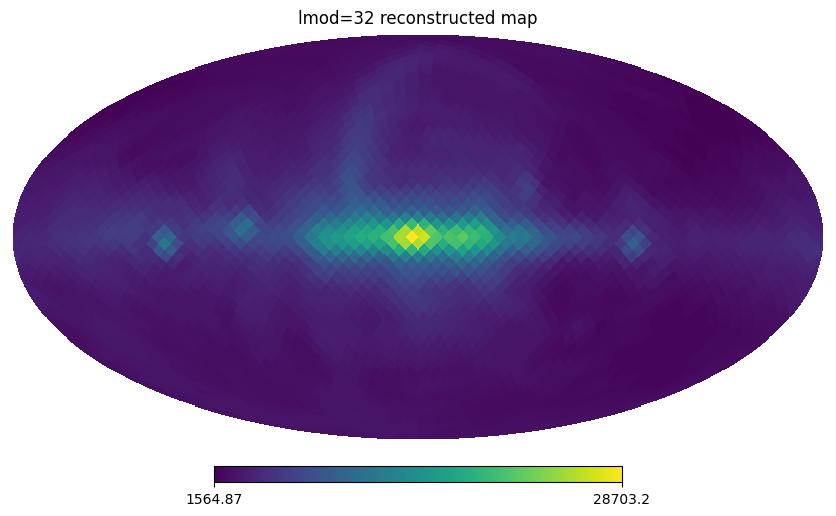

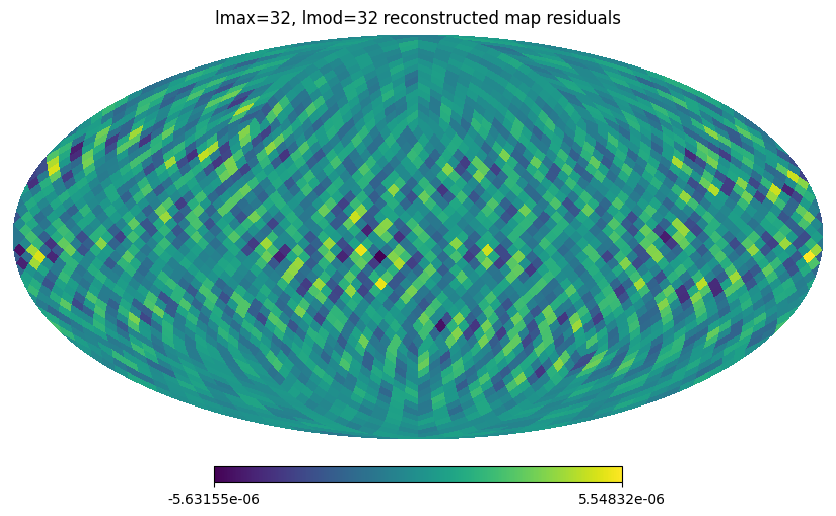

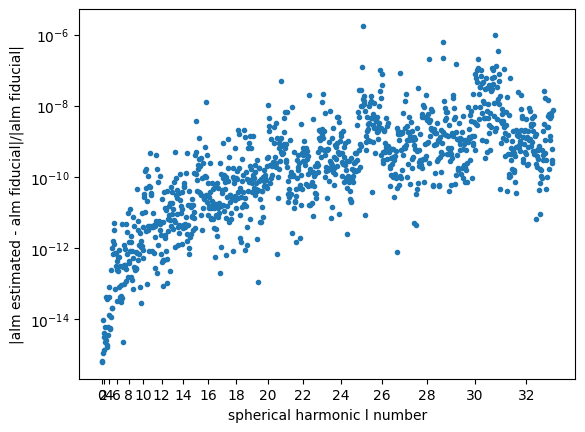

1.5179905176329118e-06

In [6]:
# First model the Gaussian random field perfectly.
mat_W_perfect = MM.calc_ml_estimator_matrix(mat_A=mat_A_fm, mat_N=noise_covar)
a_ml_noisefree = mat_W_perfect @ d
a_ml_noisy = mat_W_perfect @ d_noisy

# Noise free case.
compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_noisefree, ylm_mat=ylm_mat)

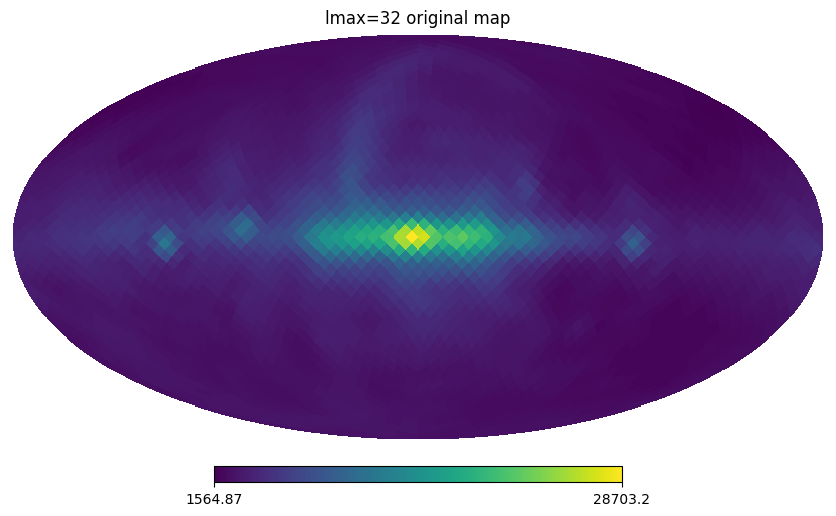

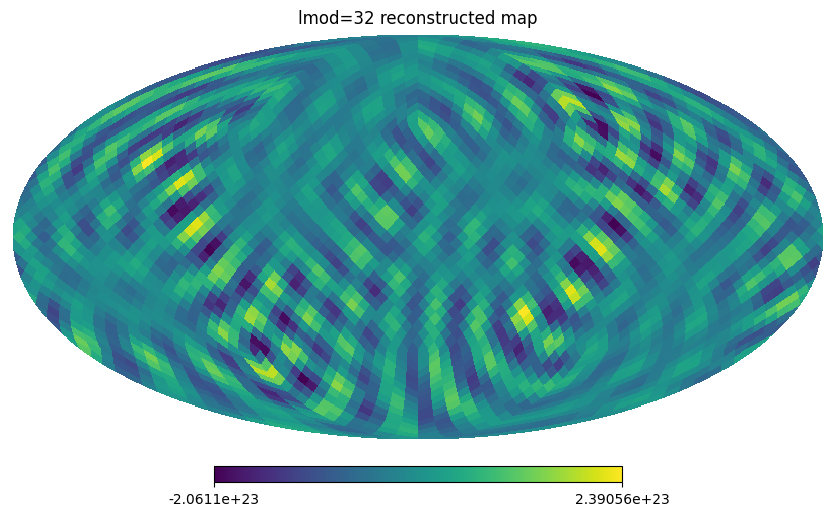

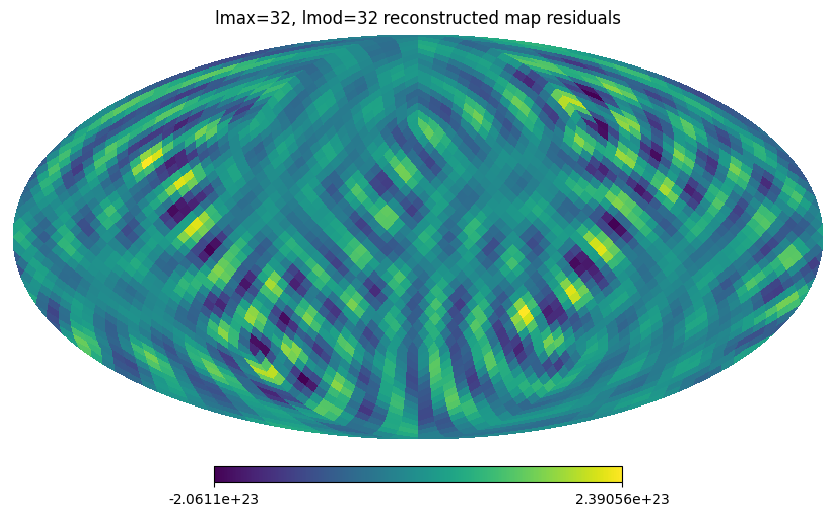

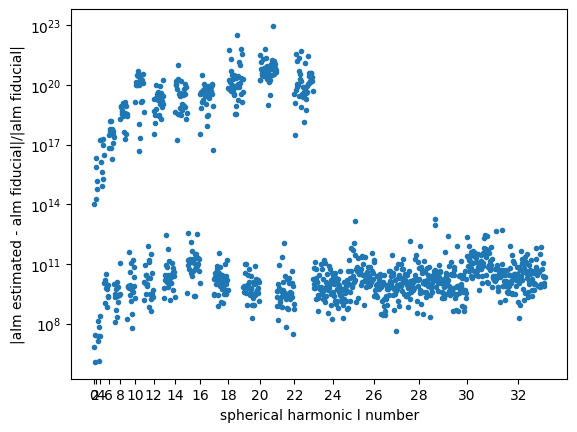

In [8]:
# Noisy case.
compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_noisy, ylm_mat=ylm_mat)

In [124]:
from importlib import reload
reload(FM)

<module 'src.forward_model' from '/Users/yordani/Documents/boosted_compass/matrix-observer/src/forward_model.py'>

3072 276


/Users/yordani/Documents/boosted_compass/matrix-observer/src/spherical_harmonics.py:133: ComplexWarning: Casting complex values to real discards the imaginary part
  almr[idxr_p] = almc[idxc]


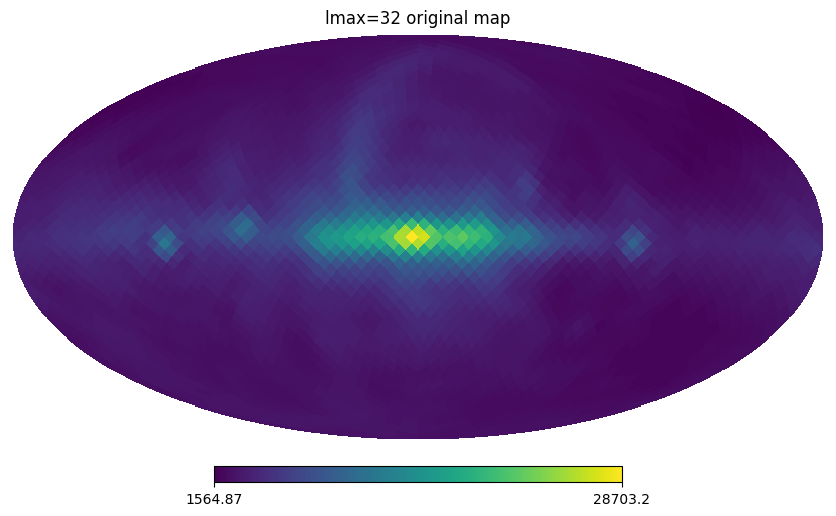

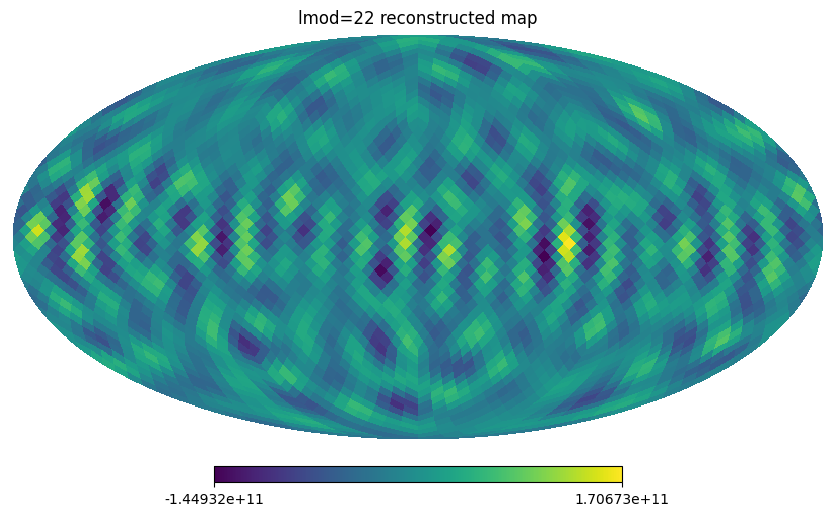

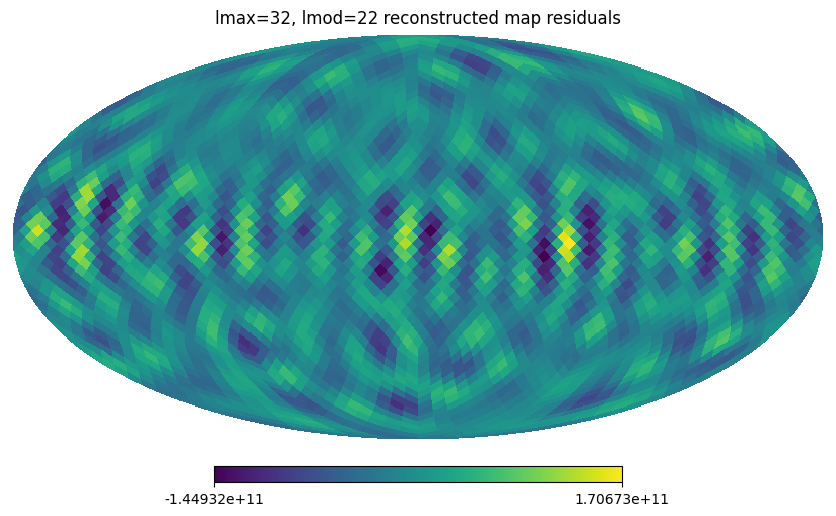

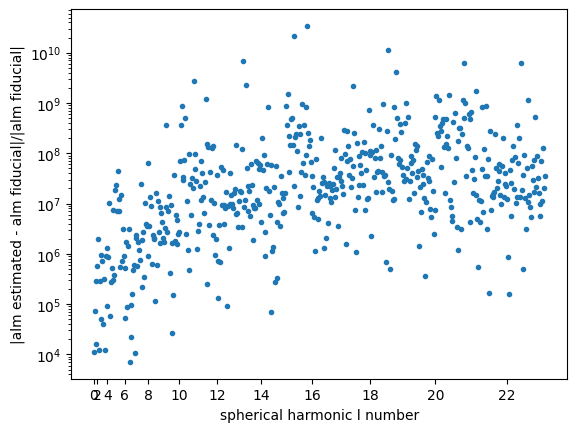

In [15]:
# Now model the field badly with missing modes.
lmod = 22
mat_A_lowl, mats = FM.calc_observation_matrix_multi_zenith_driftscan(nside=nside, lmax=lmod, lats=lats, beam_use=narrow_cosbeam, times=times, return_mat=True)
mat_W_lowl = MM.calc_ml_estimator_matrix(mat_A=mat_A_lowl, mat_N=noise_covar)
mat_G_lowl, mat_P_lowl, mat_Y_lowl, mat_B_lowl = mats
a_ml_lowl_noisefree = mat_W_lowl @ d
a_ml_lowl_noisy = mat_W_lowl @ d_noisy

# Noise free case
compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_lowl_noisefree, ylm_mat=ylm_mat)

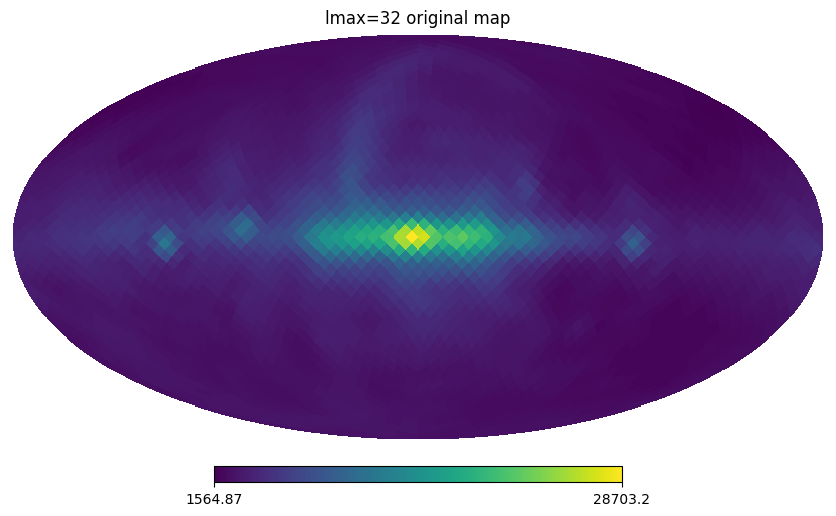

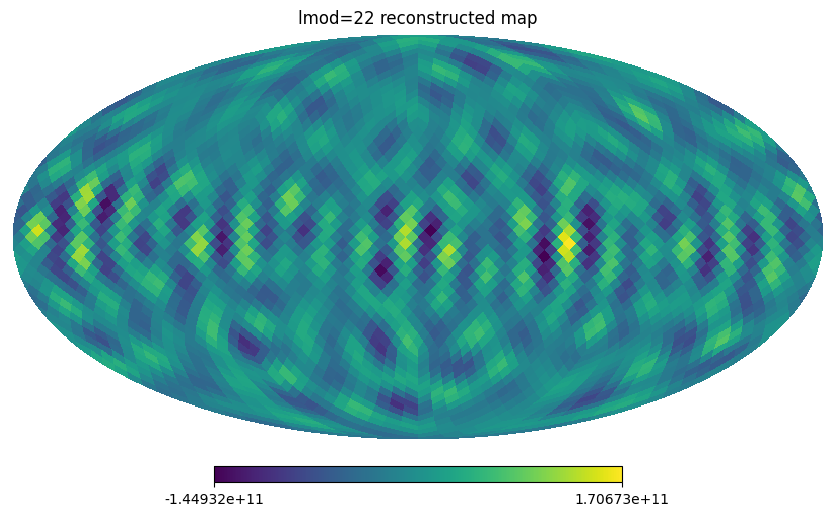

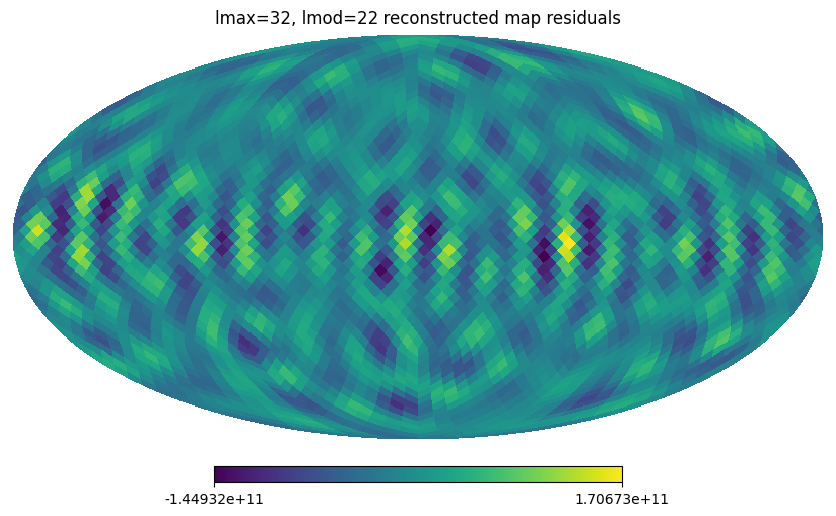

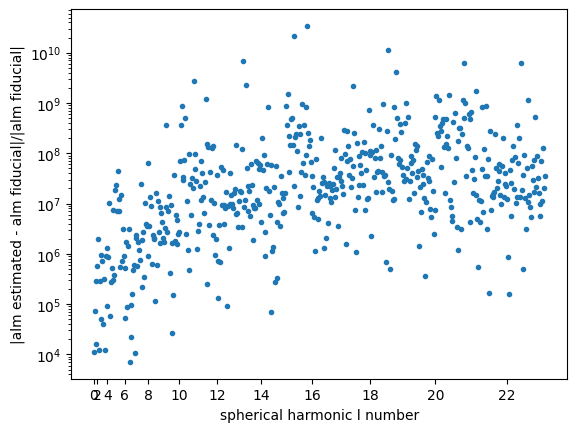

In [16]:
# Noisy case.
compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_lowl_noisy, ylm_mat=ylm_mat)

In [17]:
# Now incorporate some missing-modes modelling.
def calc_full_unmodelled_mode_matrix(lmod, lmax, nside, foreground_power_spec, beam_mat, binning_mat, pointing_mat):
    """
    Calculate the unmodelled mode matrix for the non-trivial observation 
    strategy and binning of timeseries data into Ntau bins.
    """
    npix = hp.nside2npix(nside)
    vectors = hp.pix2vec(nside, ipix=list(range(npix)))
    vectors = np.array(vectors).T
    vector_difference = np.einsum("pi,qi->pq", vectors, vectors)
    binpoint_mat = binning_mat@pointing_mat
    val = np.sum([((2*l+1)/(4*np.pi)) * eval_legendre(l, vector_difference) * foreground_power_spec[l] * beam_mat[l,l]**2 for l in range(lmod+1, lmax)], axis=0)
    return binpoint_mat@val@(binpoint_mat.T)

mat_S = calc_full_unmodelled_mode_matrix(lmod=lmod, lmax=lmax, foreground_power_spec=fg_cl, nside=nside, beam_mat=mat_B_lowl, binning_mat=mat_G_lowl, pointing_mat=mat_P_lowl)

# Carry out the corrected ML estimate.
mat_W_corrected = MM.calc_ml_estimator_matrix(mat_A=mat_A_lowl, mat_N=noise_covar+mat_S)
a_ml_corrected_noisefree = mat_W_corrected @ d
a_ml_corrected_noisy = mat_W_corrected @ d_noisy

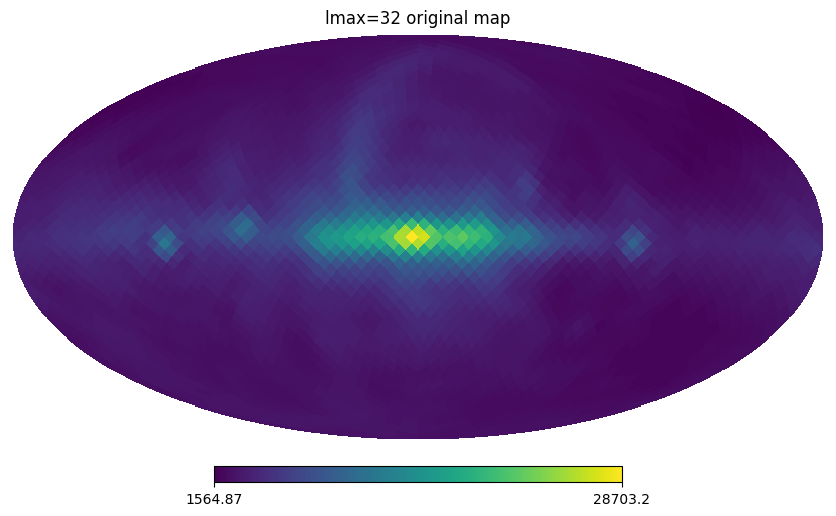

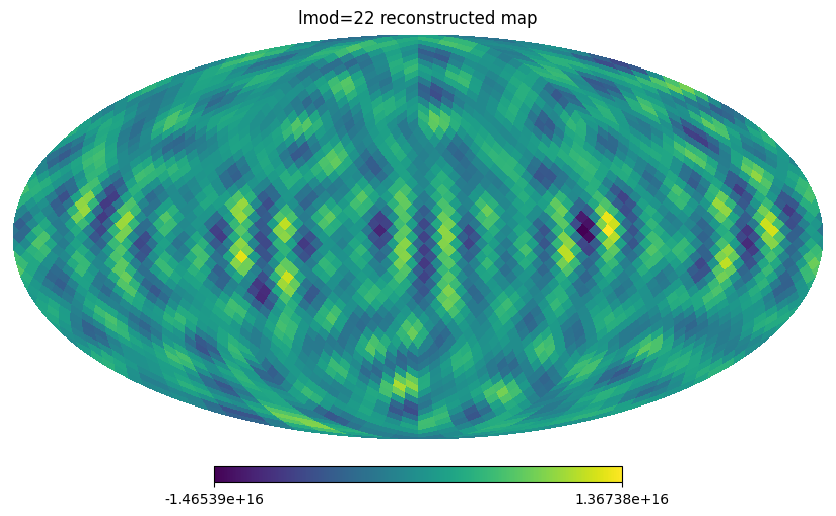

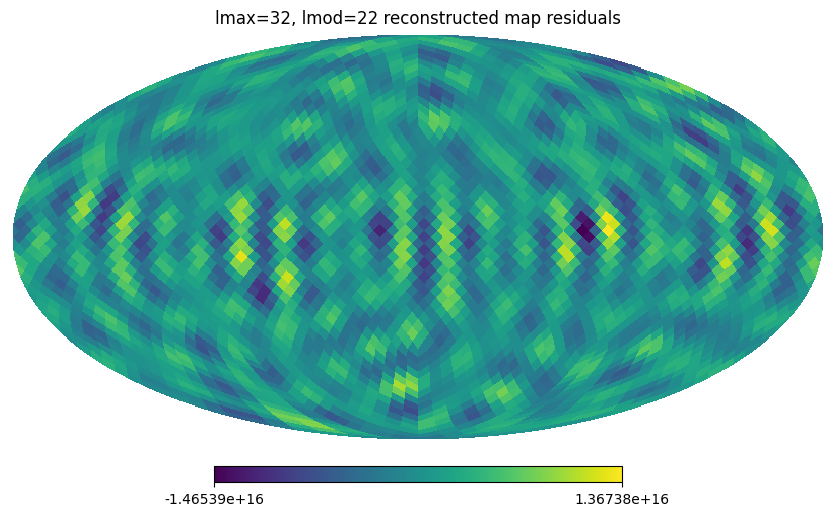

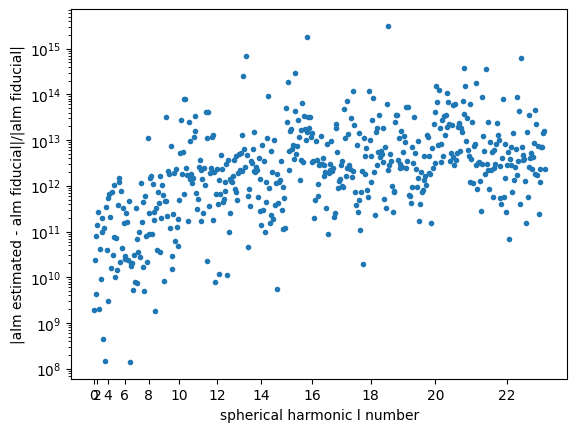

In [18]:
# Noise free case.
compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_corrected_noisefree, ylm_mat=ylm_mat)

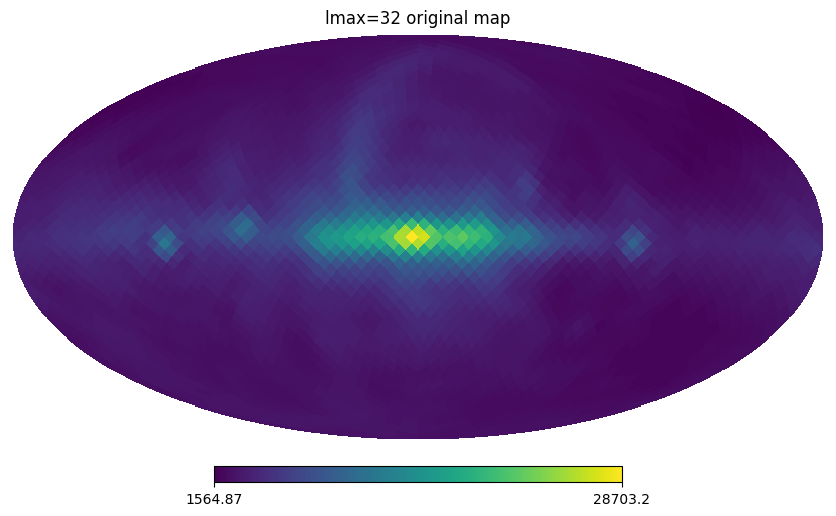

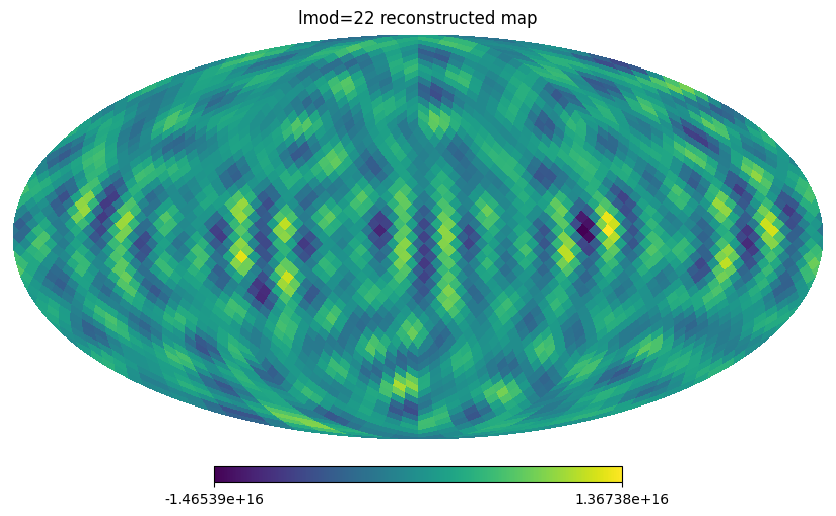

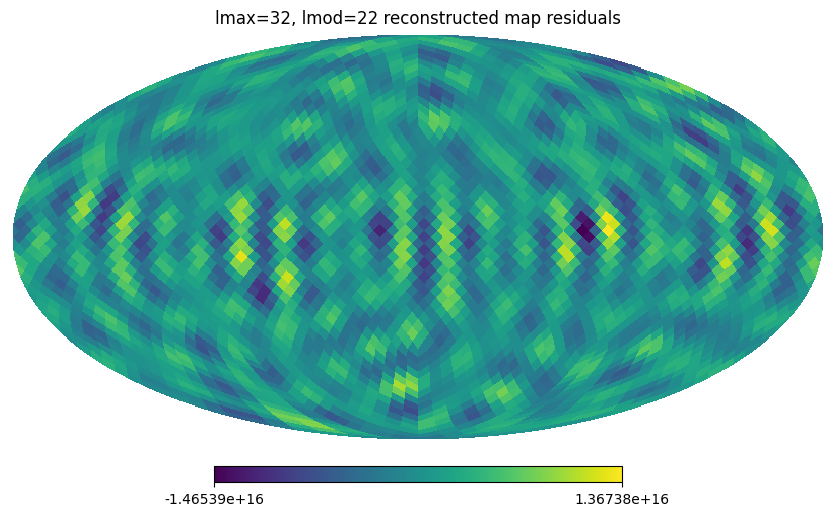

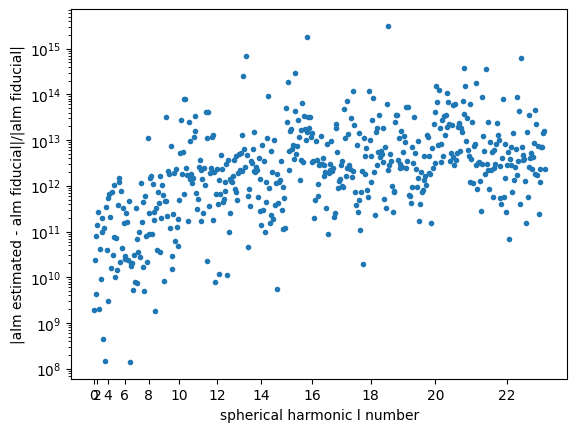

In [19]:
# Noisy case.
compare_estimate_to_reality(a_reality=fg_gauss_alm, a_estimate=a_ml_corrected_noisy, ylm_mat=ylm_mat)

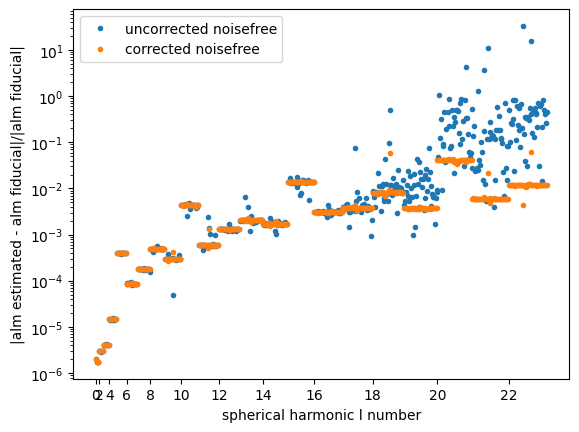

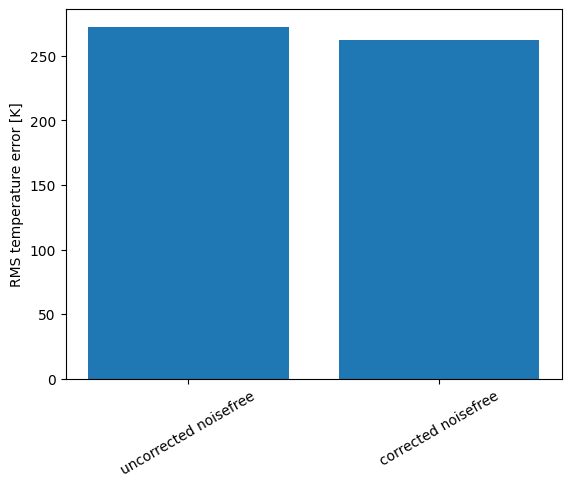

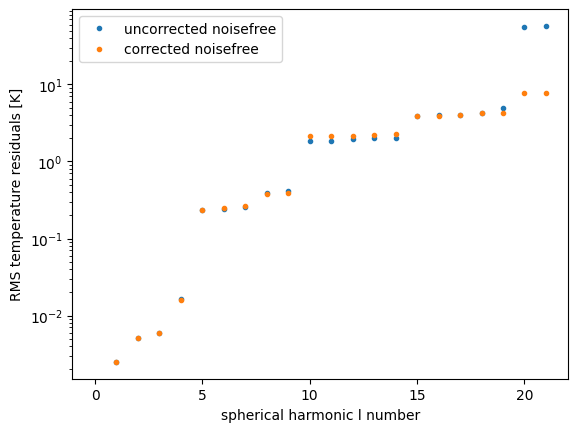

In [ ]:
compare_reconstructions(fg_gauss_alm, a_ml_lowl_noisefree, a_ml_corrected_noisefree, labels=['uncorrected noisefree', 'corrected noisefree'], ylm_mat=ylm_mat)

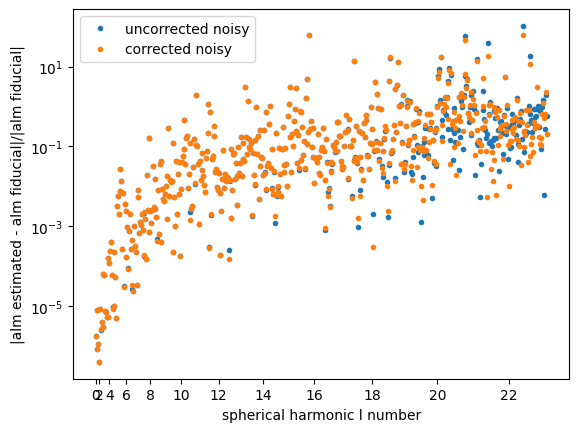

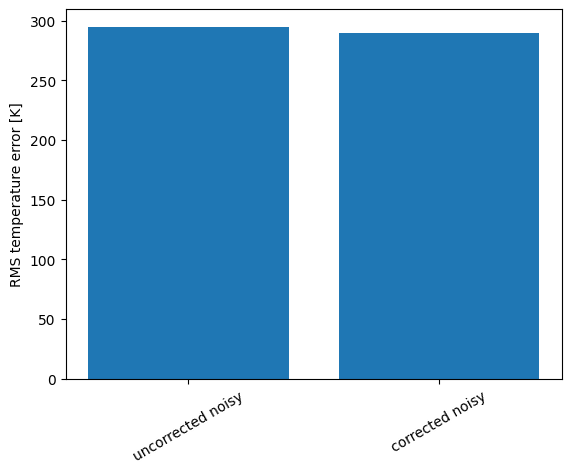

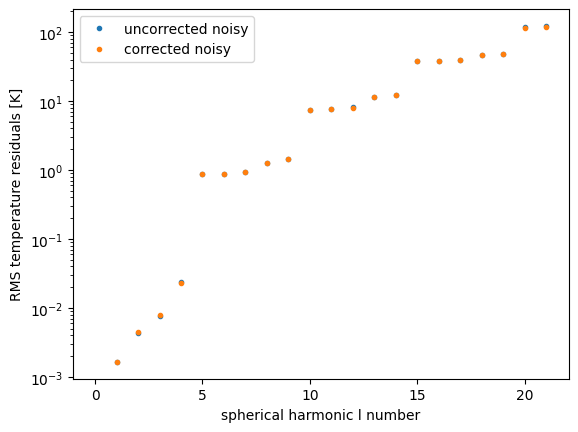

In [ ]:
compare_reconstructions(fg_gauss_alm, a_ml_lowl_noisy, a_ml_corrected_noisy, labels=['uncorrected noisy', 'corrected noisy'], ylm_mat=ylm_mat)

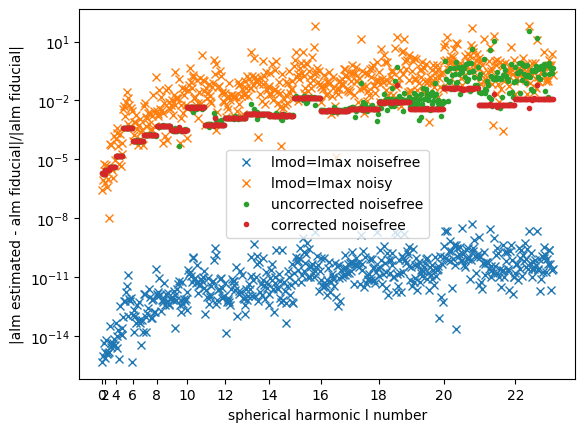

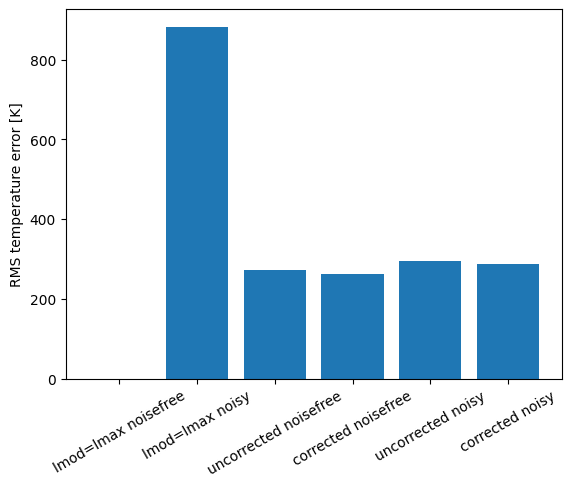

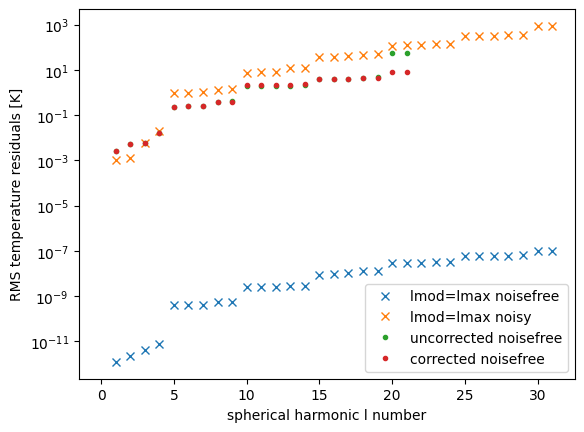

In [ ]:
compare_reconstructions(fg_gauss_alm, a_ml_noisefree, a_ml_noisy, a_ml_lowl_noisefree, a_ml_corrected_noisefree, a_ml_lowl_noisy, a_ml_corrected_noisy, labels=['lmod=lmax noisefree', 'lmod=lmax noisy', 'uncorrected noisefree', 'corrected noisefree', 'uncorrected noisy', 'corrected noisy'], fmts=['x', 'x', '.', '.'], ylm_mat=ylm_mat)

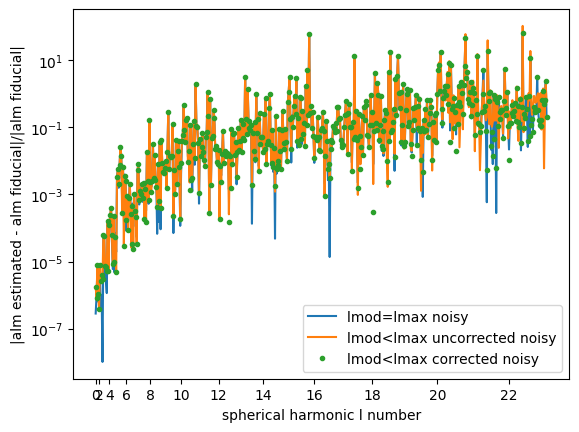

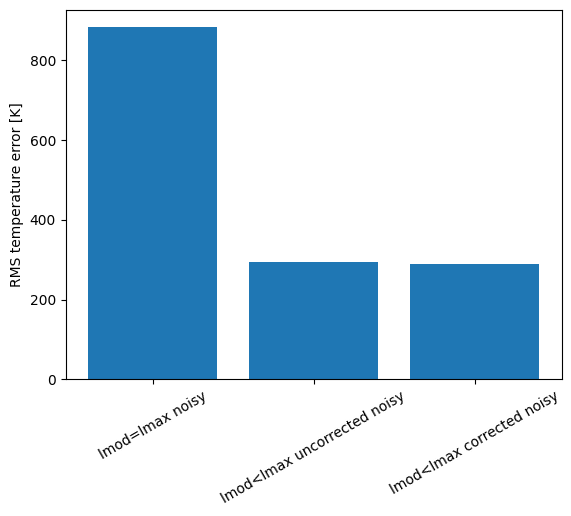

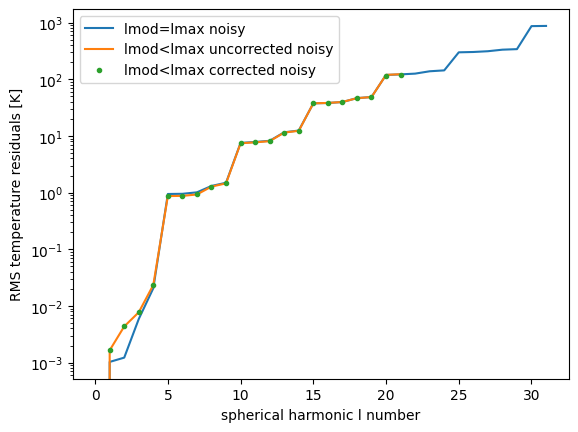

In [ ]:
compare_reconstructions(fg_gauss_alm, a_ml_noisy, a_ml_lowl_noisy, a_ml_corrected_noisy, labels=['lmod=lmax noisy', 'lmod<lmax uncorrected noisy', 'lmod<lmax corrected noisy'], fmts=['-', '-', '.'], ylm_mat=ylm_mat)

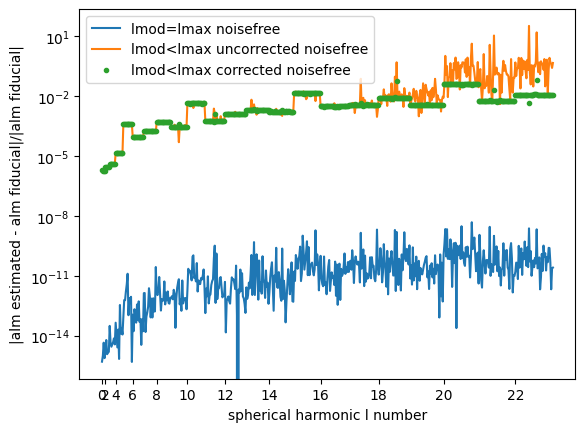

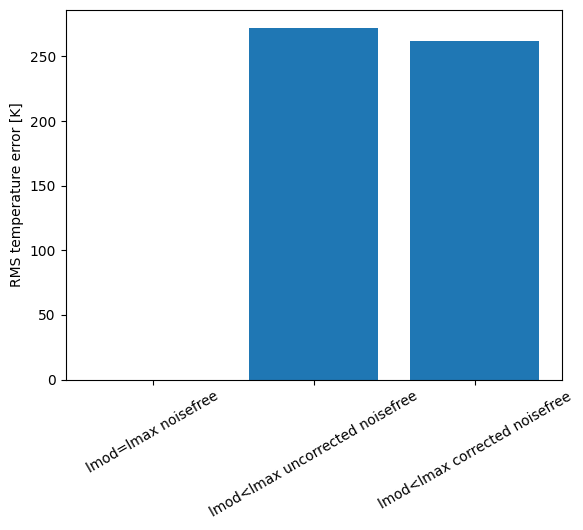

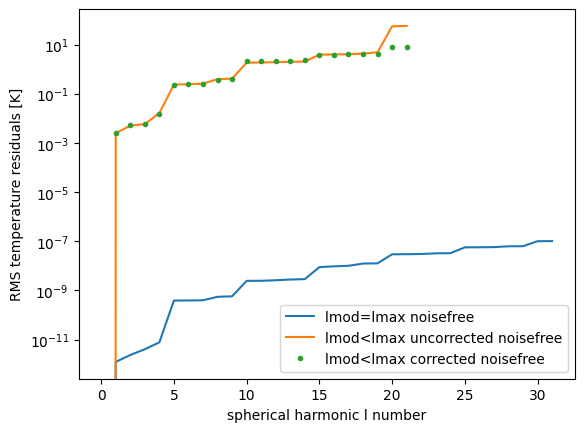

In [ ]:
compare_reconstructions(fg_gauss_alm, a_ml_noisefree, a_ml_lowl_noisefree, a_ml_corrected_noisefree, labels=['lmod=lmax noisefree', 'lmod<lmax uncorrected noisefree', 'lmod<lmax corrected noisefree'], fmts=['-', '-', '.'], ylm_mat=ylm_mat)